In [1]:
#@markdown ## ⚠️ PLEASE NOTE:
#@markdown This colab runs best using a GPU runtime.  From the Colab menu, choose Runtime > Change Runtime Type, then select **'GPU'** in the dropdown.

import functools
import jax
import os

from datetime import datetime
from jax import numpy as jp
import matplotlib.pyplot as plt

from IPython.display import HTML, clear_output

try:
  import brax
except ImportError:
  !pip install git+https://github.com/google/brax.git@main
  clear_output()
  import brax

import flax
from brax import envs
from brax.io import model
from brax.io import json
from brax.io import html

if 'COLAB_TPU_ADDR' in os.environ:
  from jax.tools import colab_tpu
  colab_tpu.setup_tpu()

In [2]:
!find /usr/local/lib/python3.*/dist-packages/brax/ -name "networks.py"

/usr/local/lib/python3.11/dist-packages/brax/training/networks.py
/usr/local/lib/python3.11/dist-packages/brax/training/agents/apg/networks.py
/usr/local/lib/python3.11/dist-packages/brax/training/agents/ppo/networks.py
/usr/local/lib/python3.11/dist-packages/brax/training/agents/sac/networks.py
/usr/local/lib/python3.11/dist-packages/brax/training/agents/bc/networks.py
/usr/local/lib/python3.11/dist-packages/brax/training/agents/ars/networks.py
/usr/local/lib/python3.11/dist-packages/brax/training/agents/es/networks.py


In [3]:
with open('/usr/local/lib/python3.11/dist-packages/brax/training/networks.py', 'r') as file:
    code = file.read()
print(code)  # Print the existing code to verify

# Copyright 2025 The Brax Authors.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

"""Network definitions."""

import dataclasses
import functools
from typing import Any, Callable, Literal, Mapping, Sequence, Tuple
import warnings

from brax.training import types
from brax.training.acme import running_statistics
from brax.training.spectral_norm import SNDense
from flax import linen
import jax
import jax.numpy as jnp

ActivationFn = Callable[[jnp.ndarray], jnp.ndarray]
Initializer = Callable[..., 

In [4]:
# New code to be inserted
new_code1 = '''
# Copyright 2024 The Brax Authors.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

"""Network definitions."""

import dataclasses
import functools
from typing import Any, Callable, Mapping, Sequence, Tuple
import warnings

from brax.training import types
from brax.training.acme import running_statistics
from brax.training.spectral_norm import SNDense
from flax import linen
import jax
import jax.numpy as jnp


ActivationFn = Callable[[jnp.ndarray], jnp.ndarray]
Initializer = Callable[..., Any]


@dataclasses.dataclass
class FeedForwardNetwork:
  init: Callable[..., Any]
  apply: Callable[..., Any]


class MLP(linen.Module):
  """MLP module."""

  layer_sizes: Sequence[int]
  activation: ActivationFn = linen.relu
  kernel_init: Initializer = jax.nn.initializers.lecun_uniform()
  activate_final: bool = False
  bias: bool = True
  layer_norm: bool = False

  @linen.compact
  def __call__(self, data: jnp.ndarray):
    hidden = data
    for i, hidden_size in enumerate(self.layer_sizes):
      hidden = linen.Dense(
          hidden_size,
          name=f'hidden_{i}',
          kernel_init=self.kernel_init,
          use_bias=self.bias,
      )(hidden)
      if i != len(self.layer_sizes) - 1 or self.activate_final:
        hidden = self.activation(hidden)
        if self.layer_norm:
          hidden = linen.LayerNorm()(hidden)
    return hidden


class SNMLP(linen.Module):
  """MLP module with Spectral Normalization."""

  layer_sizes: Sequence[int]
  activation: ActivationFn = linen.relu
  kernel_init: Initializer = jax.nn.initializers.lecun_uniform()
  activate_final: bool = False
  bias: bool = True

  @linen.compact
  def __call__(self, data: jnp.ndarray):
    hidden = data
    for i, hidden_size in enumerate(self.layer_sizes):
      hidden = SNDense(
          hidden_size,
          name=f'hidden_{i}',
          kernel_init=self.kernel_init,
          use_bias=self.bias,
      )(hidden)
      if i != len(self.layer_sizes) - 1 or self.activate_final:
        hidden = self.activation(hidden)
    return hidden


class CNN(linen.Module):
  """CNN module. Inputs are expected in Batch * HWC format."""

  num_filters: Sequence[int]
  kernel_sizes: Sequence[Tuple]
  strides: Sequence[Tuple]
  activation: ActivationFn = linen.relu
  use_bias: bool = True

  @linen.compact
  def __call__(self, data: jnp.ndarray):
    hidden = data
    for i, (num_filter, kernel_size, stride) in enumerate(
        zip(self.num_filters, self.kernel_sizes, self.strides)
    ):
      hidden = linen.Conv(
          num_filter,
          kernel_size=kernel_size,
          strides=stride,
          use_bias=self.use_bias,
      )(hidden)

      hidden = self.activation(hidden)
    return hidden


class VisionMLP(linen.Module):
  """Applies a CNN backbone then an MLP.

  The CNN architecture originates from the paper:
  "Human-level control through deep reinforcement learning",
  Nature 518, no. 7540 (2015): 529-533
  """

  layer_sizes: Sequence[int]
  activation: ActivationFn = linen.relu
  kernel_init: Initializer = jax.nn.initializers.lecun_uniform()
  activate_final: bool = False
  layer_norm: bool = False
  normalise_channels: bool = False
  state_obs_key: str = ''

  @linen.compact
  def __call__(self, data: dict):
    pixels_hidden = {k: v for k, v in data.items() if k.startswith('pixels/')}
    if self.normalise_channels:
      # Calculates shared statistics over an entire 2D image.
      image_layernorm = functools.partial(
          linen.LayerNorm,
          use_bias=False,
          use_scale=False,
          reduction_axes=(-1, -2),
      )

      def ln_per_chan(v: jax.Array):
        normalised = [
            image_layernorm()(v[..., chan]) for chan in range(v.shape[-1])
        ]
        return jnp.stack(normalised, axis=-1)

      pixels_hidden = jax.tree.map(ln_per_chan, pixels_hidden)

    natureCNN = functools.partial(
        CNN,
        num_filters=[32, 64, 64],
        kernel_sizes=[(8, 8), (4, 4), (3, 3)],
        strides=[(4, 4), (2, 2), (1, 1)],
        activation=linen.relu,
        use_bias=False,
    )
    cnn_outs = [natureCNN()(pixels_hidden[key]) for key in pixels_hidden]
    cnn_outs = [jnp.mean(cnn_out, axis=(-2, -3)) for cnn_out in cnn_outs]
    if self.state_obs_key:
      cnn_outs.append(
          data[self.state_obs_key]
      )  # TODO: Try with dedicated state network

    hidden = jnp.concatenate(cnn_outs, axis=-1)
    return MLP(
        layer_sizes=self.layer_sizes,
        activation=self.activation,
        kernel_init=self.kernel_init,
        activate_final=self.activate_final,
        layer_norm=self.layer_norm,
    )(hidden)


def _get_obs_state_size(obs_size: types.ObservationSize, obs_key: str) -> int:
  obs_size = obs_size[obs_key] if isinstance(obs_size, Mapping) else obs_size
  return jax.tree_util.tree_flatten(obs_size)[0][-1]


def make_policy_network(
    param_size: int,
    obs_size: types.ObservationSize,
    preprocess_observations_fn: types.PreprocessObservationFn = types.identity_observation_preprocessor,
    hidden_layer_sizes: Sequence[int] = (512, 512, 512, 512, 512),
    activation: ActivationFn = linen.relu,
    kernel_init: Initializer = jax.nn.initializers.lecun_uniform(),
    layer_norm: bool = False,
    obs_key: str = 'state',
) -> FeedForwardNetwork:
  """Creates a policy network."""
  policy_module = MLP(
      layer_sizes=list(hidden_layer_sizes) + [param_size],
      activation=activation,
      kernel_init=kernel_init,
      layer_norm=layer_norm,
  )

  def apply(processor_params, policy_params, obs):
    obs = preprocess_observations_fn(obs, processor_params)
    obs = obs if isinstance(obs, jax.Array) else obs[obs_key]
    return policy_module.apply(policy_params, obs)

  obs_size = _get_obs_state_size(obs_size, obs_key)
  dummy_obs = jnp.zeros((1, obs_size))
  return FeedForwardNetwork(
      init=lambda key: policy_module.init(key, dummy_obs), apply=apply
  )


def make_value_network(
    obs_size: types.ObservationSize,
    preprocess_observations_fn: types.PreprocessObservationFn = types.identity_observation_preprocessor,
    hidden_layer_sizes: Sequence[int] = (512, 512, 512, 512, 512),
    activation: ActivationFn = linen.relu,
    obs_key: str = 'state',
) -> FeedForwardNetwork:
  """Creates a value network."""
  value_module = MLP(
      layer_sizes=list(hidden_layer_sizes) + [1],
      activation=activation,
      kernel_init=jax.nn.initializers.lecun_uniform(),
  )

  def apply(processor_params, value_params, obs):
    obs = preprocess_observations_fn(obs, processor_params)
    obs = obs if isinstance(obs, jax.Array) else obs[obs_key]
    return jnp.squeeze(value_module.apply(value_params, obs), axis=-1)

  obs_size = _get_obs_state_size(obs_size, obs_key)
  dummy_obs = jnp.zeros((1, obs_size))
  return FeedForwardNetwork(
      init=lambda key: value_module.init(key, dummy_obs), apply=apply
  )


def make_q_network(
    obs_size: types.ObservationSize,
    action_size: int,
    preprocess_observations_fn: types.PreprocessObservationFn = types.identity_observation_preprocessor,
    hidden_layer_sizes: Sequence[int] = (256, 256, 256, 256, 256),
    activation: ActivationFn = linen.relu,
    n_critics: int = 2,
    layer_norm: bool = False,
) -> FeedForwardNetwork:
  """Creates a value network."""

  class QModule(linen.Module):
    """Q Module."""

    n_critics: int

    @linen.compact
    def __call__(self, obs: jnp.ndarray, actions: jnp.ndarray):
      hidden = jnp.concatenate([obs, actions], axis=-1)
      res = []
      for _ in range(self.n_critics):
        q = MLP(
            layer_sizes=list(hidden_layer_sizes) + [1],
            activation=activation,
            kernel_init=jax.nn.initializers.lecun_uniform(),
            layer_norm=layer_norm,
        )(hidden)
        res.append(q)
      return jnp.concatenate(res, axis=-1)

  q_module = QModule(n_critics=n_critics)

  def apply(processor_params, q_params, obs, actions):
    obs = preprocess_observations_fn(obs, processor_params)
    return q_module.apply(q_params, obs, actions)

  dummy_obs = jnp.zeros((1, obs_size))
  dummy_action = jnp.zeros((1, action_size))
  return FeedForwardNetwork(
      init=lambda key: q_module.init(key, dummy_obs, dummy_action), apply=apply
  )


def make_model(
    layer_sizes: Sequence[int],
    obs_size: int,
    activation: Callable[[jnp.ndarray], jnp.ndarray] = linen.swish,
    spectral_norm: bool = False,
) -> FeedForwardNetwork:
  """Creates a model.

  Args:
    layer_sizes: layers
    obs_size: size of an observation
    activation: activation
    spectral_norm: whether to use a spectral normalization (default: False).

  Returns:
    a model
  """
  warnings.warn(
      'make_model is deprecated, use make_{policy|q|value}_network instead.'
  )
  dummy_obs = jnp.zeros((1, obs_size))
  if spectral_norm:
    module = SNMLP(layer_sizes=layer_sizes, activation=activation)
    model = FeedForwardNetwork(
        init=lambda rng1, rng2: module.init(
            {'params': rng1, 'sing_vec': rng2}, dummy_obs
        ),
        apply=module.apply,
    )
  else:
    module = MLP(layer_sizes=layer_sizes, activation=activation)
    model = FeedForwardNetwork(
        init=lambda rng: module.init(rng, dummy_obs), apply=module.apply
    )
  return model


def make_models(
    policy_params_size: int, obs_size: int
) -> Tuple[FeedForwardNetwork, FeedForwardNetwork]:
  """Creates models for policy and value functions.

  Args:
    policy_params_size: number of params that a policy network should generate
    obs_size: size of an observation

  Returns:
    a model for policy and a model for value function
  """
  warnings.warn(
      'make_models is deprecated, use make_{policy|q|value}_network instead.'
  )
  policy_model = make_model([512, 512, 512, 512, 512, policy_params_size], obs_size)
  value_model = make_model([512, 512, 512, 512, 512, 1], obs_size)
  return policy_model, value_model


def normalizer_select(
    processor_params: running_statistics.RunningStatisticsState, obs_key: str
) -> running_statistics.RunningStatisticsState:
  return running_statistics.RunningStatisticsState(
      count=processor_params.count,
      mean=processor_params.mean[obs_key],
      summed_variance=processor_params.summed_variance[obs_key],
      std=processor_params.std[obs_key],
  )


def make_policy_network_vision(
    observation_size: Mapping[str, Tuple[int, ...]],
    output_size: int,
    preprocess_observations_fn: types.PreprocessObservationFn = types.identity_observation_preprocessor,
    hidden_layer_sizes: Sequence[int] = [256, 256, 256, 256, 256],
    activation: ActivationFn = linen.swish,
    kernel_init: Initializer = jax.nn.initializers.lecun_uniform(),
    layer_norm: bool = False,
    state_obs_key: str = '',
    normalise_channels: bool = False,
) -> FeedForwardNetwork:
  """Creates a policy network for vision inputs."""
  module = VisionMLP(
      layer_sizes=list(hidden_layer_sizes) + [output_size],
      activation=activation,
      kernel_init=kernel_init,
      layer_norm=layer_norm,
      normalise_channels=normalise_channels,
      state_obs_key=state_obs_key,
  )

  def apply(processor_params, policy_params, obs):
    if state_obs_key:
      state_obs = preprocess_observations_fn(
          obs[state_obs_key], normalizer_select(processor_params, state_obs_key)
      )
      obs = {**obs, state_obs_key: state_obs}
    return module.apply(policy_params, obs)

  dummy_obs = {
      key: jnp.zeros((1,) + shape) for key, shape in observation_size.items()
  }
  return FeedForwardNetwork(
      init=lambda key: module.init(key, dummy_obs), apply=apply
  )


def make_value_network_vision(
    observation_size: Mapping[str, Tuple[int, ...]],
    preprocess_observations_fn: types.PreprocessObservationFn = types.identity_observation_preprocessor,
    hidden_layer_sizes: Sequence[int] = [256, 256, 256, 256, 256],
    activation: ActivationFn = linen.swish,
    kernel_init: Initializer = jax.nn.initializers.lecun_uniform(),
    state_obs_key: str = '',
    normalise_channels: bool = False,
) -> FeedForwardNetwork:
  """Creates a value network for vision inputs."""
  value_module = VisionMLP(
      layer_sizes=list(hidden_layer_sizes) + [1],
      activation=activation,
      kernel_init=kernel_init,
      normalise_channels=normalise_channels,
      state_obs_key=state_obs_key,
  )

  def apply(processor_params, policy_params, obs):
    if state_obs_key:
      state_obs = preprocess_observations_fn(
          obs[state_obs_key], normalizer_select(processor_params, state_obs_key)
      )
      obs = {**obs, state_obs_key: state_obs}
    return jnp.squeeze(value_module.apply(policy_params, obs), axis=-1)

  dummy_obs = {
      key: jnp.zeros((1,) + shape) for key, shape in observation_size.items()
  }
  return FeedForwardNetwork(
      init=lambda key: value_module.init(key, dummy_obs), apply=apply
  )
'''

with open('/usr/local/lib/python3.11/dist-packages/brax/training/networks.py', 'w') as file:
    file.write(new_code1)

In [5]:
with open('/usr/local/lib/python3.11/dist-packages/brax/training/networks.py', 'r') as file:
    updated_code1 = file.read()
print(updated_code1)  # Verify the updated content


# Copyright 2024 The Brax Authors.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

"""Network definitions."""

import dataclasses
import functools
from typing import Any, Callable, Mapping, Sequence, Tuple
import warnings

from brax.training import types
from brax.training.acme import running_statistics
from brax.training.spectral_norm import SNDense
from flax import linen
import jax
import jax.numpy as jnp


ActivationFn = Callable[[jnp.ndarray], jnp.ndarray]
Initializer = Callable[..., Any]




In [6]:
with open('/usr/local/lib/python3.11/dist-packages/brax/training/agents/ppo/networks.py', 'r') as file:
    code = file.read()
print(code)  # Print the existing code to verify

# Copyright 2025 The Brax Authors.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

"""PPO networks."""

from typing import Literal, Sequence, Tuple

from brax.training import distribution
from brax.training import networks
from brax.training import types
from brax.training.types import PRNGKey
import flax
from flax import linen


@flax.struct.dataclass
class PPONetworks:
  policy_network: networks.FeedForwardNetwork
  value_network: networks.FeedForwardNetwork
  parametric_action_distribution: di

In [7]:
# New code to be inserted
new_code = '''
# Copyright 2024 The Brax Authors.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

"""PPO networks."""

from typing import Sequence, Tuple

from brax.training import distribution
from brax.training import networks
from brax.training import types
from brax.training.types import PRNGKey
import flax
from flax import linen


@flax.struct.dataclass
class PPONetworks:
  policy_network: networks.FeedForwardNetwork
  value_network: networks.FeedForwardNetwork
  parametric_action_distribution: distribution.ParametricDistribution


def make_inference_fn(ppo_networks: PPONetworks):
  """Creates params and inference function for the PPO agent."""

  def make_policy(
      params: types.Params, deterministic: bool = False
  ) -> types.Policy:
    policy_network = ppo_networks.policy_network
    parametric_action_distribution = ppo_networks.parametric_action_distribution

    def policy(
        observations: types.Observation, key_sample: PRNGKey
    ) -> Tuple[types.Action, types.Extra]:
      param_subset = (params[0], params[1])  # normalizer and policy params
      logits = policy_network.apply(*param_subset, observations)
      if deterministic:
        return ppo_networks.parametric_action_distribution.mode(logits), {}
      raw_actions = parametric_action_distribution.sample_no_postprocessing(
          logits, key_sample
      )
      log_prob = parametric_action_distribution.log_prob(logits, raw_actions)
      postprocessed_actions = parametric_action_distribution.postprocess(
          raw_actions
      )
      return postprocessed_actions, {
          'log_prob': log_prob,
          'raw_action': raw_actions,
      }

    return policy

  return make_policy


def make_ppo_networks(
    observation_size: types.ObservationSize,
    action_size: int,
    preprocess_observations_fn: types.PreprocessObservationFn = types.identity_observation_preprocessor,
    policy_hidden_layer_sizes: Sequence[int] = (200,) * 4,
    value_hidden_layer_sizes: Sequence[int] = (256,) * 4,
    activation: networks.ActivationFn = linen.swish,
    policy_obs_key: str = 'state',
    value_obs_key: str = 'state',
) -> PPONetworks:
  """Make PPO networks with preprocessor."""
  parametric_action_distribution = distribution.NormalTanhDistribution(
      event_size=action_size
  )
  policy_network = networks.make_policy_network(
      parametric_action_distribution.param_size,
      observation_size,
      preprocess_observations_fn=preprocess_observations_fn,
      hidden_layer_sizes=policy_hidden_layer_sizes,
      activation=activation,
      obs_key=policy_obs_key,
  )
  value_network = networks.make_value_network(
      observation_size,
      preprocess_observations_fn=preprocess_observations_fn,
      hidden_layer_sizes=value_hidden_layer_sizes,
      activation=activation,
      obs_key=value_obs_key,
  )

  return PPONetworks(
      policy_network=policy_network,
      value_network=value_network,
      parametric_action_distribution=parametric_action_distribution,
  )
'''
with open('/usr/local/lib/python3.11/dist-packages/brax/training/agents/ppo/networks.py', 'w') as file:
    file.write(new_code)

In [8]:

with open('/usr/local/lib/python3.11/dist-packages/brax/training/agents/ppo/networks.py', 'r') as file:
    updated_code = file.read()
print(updated_code)  # Verify the updated content


# Copyright 2024 The Brax Authors.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

"""PPO networks."""

from typing import Sequence, Tuple

from brax.training import distribution
from brax.training import networks
from brax.training import types
from brax.training.types import PRNGKey
import flax
from flax import linen


@flax.struct.dataclass
class PPONetworks:
  policy_network: networks.FeedForwardNetwork
  value_network: networks.FeedForwardNetwork
  parametric_action_distribution: distributi

In [9]:
# <numeric data="0.0 0.0 0.56 1.0 0.0 0.0 0.0 0.0 0.6 0.0 0.0 0.5 0.0 0.0 -0.5 0.0 0.0 -0.6 0.0 0.0 -0.6 0.0 0.0 0.6 0.0" name="init_qpos"/>

In [10]:
import brax
from jax import numpy as jp
from brax.io import mjcf, html

ant_xml = """
<mujoco model="ant">
  <compiler angle="degree" coordinate="local" inertiafromgeom="true" settotalmass="20"/>
  <option timestep="0.01" iterations="4" />
  <custom>
    <!-- brax custom params -->
    <numeric data="0.0 0.0 0.56 1.0 0.0 0.0 0.0 0.0 0.6 0.0 0.0 0.5 0.0 0.0 -0.5 0.0 0.0 -0.6 0.0 0.0 -0.6 0.0 0.0 0.6 0.0" name="init_qpos"/>
    <numeric data="1000" name="constraint_limit_stiffness"/>
    <numeric data="4000" name="constraint_stiffness"/>
    <numeric data="10" name="constraint_ang_damping"/>
    <numeric data="20" name="constraint_vel_damping"/>
    <numeric data="0.5" name="joint_scale_pos"/>
    <numeric data="0.2" name="joint_scale_ang"/>
    <numeric data="0.0" name="ang_damping"/>
    <numeric data="1" name="spring_mass_scale"/>
    <numeric data="1" name="spring_inertia_scale"/>
    <numeric data="15" name="solver_maxls"/>
  </custom>
  <default>
    <joint armature="1" damping="1" limited="true"/>
    <geom contype="0" conaffinity="0" condim="3" density="5.0" friction="1 0.5 0.5"/>
  </default>
  <asset>
    <texture builtin="gradient" height="100" rgb1="1 1 1" rgb2="0 0 0" type="skybox" width="100"/>
    <texture builtin="flat" height="1278" mark="cross" markrgb="1 1 1" name="texgeom" random="0.01" rgb1="0.8 0.6 0.4" rgb2="0.8 0.6 0.4" type="cube" width="127"/>
    <texture builtin="checker" height="100" name="texplane" rgb1="0 0 0" rgb2="0.8 0.8 0.8" type="2d" width="100"/>
    <material name="MatPlane" reflectance="0.5" shininess="1" specular="1" texrepeat="60 60" texture="texplane"/>
    <material name="geom" texture="texgeom" texuniform="true"/>
  </asset>
  <worldbody>

    <light cutoff="100" diffuse="1 1 1" dir="-0 0 -1.3" directional="true" exponent="1" pos="0 0 1.3" specular=".1 .1 .1"/>
    <geom conaffinity="1" condim="3" material="MatPlane" name="floor" pos="0 0 -0.01" size="1 1 1" type="plane"/>
    <geom conaffinity="1" condim="3" material="MatPlane" name="ground" pos="0 0 0" size="0 0 1" type="plane"/>

    <body name="torso" pos="0 0 1.0">
      <camera name="track" mode="trackcom" pos="0 -3 1.0" xyaxes="1 0 0 0 0 1"/>
      <geom name="torso_geom" pos="0 0 0" size="0.3 1.0 0.1" type="box" mass="10"/>
      <joint armature="0" damping="0" limited="false" margin="0.01" name="root" pos="0 0 0" type="free"/>




      <body name="front_left_leg" pos="0 0 0">
        <geom fromto="0.0 0.0 0.0 0.45 0.7 0.0" name="aux_1_geom" size="0.08" type="capsule" rgba="0 0 0.55 1"/>
        <body name="aux_1" pos="0.45 0.7 0">
          <joint axis="0 0 1" name="hip_1" pos="0.0 0.0 0.0" range="-30 30" type="hinge"/>
          <geom fromto="0.0 0.0 0.0 0.15 0.15 0.0" name="left_leg_geom" size="0.08" type="capsule" rgba="0 0 0.55 1"/>
          <body name = "front_left_mid_1" pos="0.15 0.15 0.0">
            <joint axis="-1 1 0" name="front_left_mid_ankle_1" pos="0.0 0.0 0.0" range="-15 15" type="hinge"/>
            <geom fromto="0.0 0.0 0.0 0.2 0.2 0.0" name="front_left_mid_ankle_geom" size="0.08" type="capsule" rgba="0 0 0.55 1"/>
            <body pos="0.2 0.2 0">
              <joint axis="-1 1 0" name="ankle_1" pos="0.0 0.0 0.0" range="30 70" type="hinge"/>
              <geom fromto="0.0 0.0 0.0 0.4 0.4 0.0" name="left_ankle_geom" size="0.08" type="capsule" rgba="0 0 0.55 1"/>
              <geom name="left_foot_geom" contype="1" pos="0.4 0.4 0" size="0.08" type="sphere" mass="1" rgba="0 0 0.55 1"/>
            </body>
          </body>
        </body>
      </body>

      <body name="middle_left_leg" pos="0 0 0">
        <geom fromto="0.0 0.0 0.0 0.45 0.0 0.0" name="aux_5_geom" size="0.08" type="capsule" rgba="0.55 0 0 1"/>
        <body name="aux_5" pos="0.45 0.0 0">
          <joint axis="0 0 1" name="hip_5" pos="0.0 0.0 0.0" range="-30 30" type="hinge"/>
          <geom fromto="0.0 0.0 0.0 0.20 0.0 0.0" name="mid_left_leg_geom" size="0.08" type="capsule" rgba="0.55 0 0 1"/>
          <body name = "middle_left_mid_1" pos="0.20 0.0 0">
            <joint axis="0 1 0" name="middle_left_mid_ankle_1" pos="0.0 0.0 0.0" range="-15 15" type="hinge"/>
            <geom fromto="0.0 0.0 0.0 0.28 0.0 0.0" name="middle_left_mid_ankle_geom" size="0.08" type="capsule" rgba="0.55 0 0 1"/>
            <body pos="0.28 0 0">
              <joint axis="0 1 0" name="ankle_5" pos="0.0 0.0 0.0" range="30 70" type="hinge"/>
              <geom fromto="0.0 0.0 0.0 0.64 0.0 0.0" name="mid_left_ankle_geom" size="0.08" type="capsule" rgba="0.55 0 0 1"/>
              <geom name="mid_left_foot_geom" contype="1" pos="0.64 0.0 0" size="0.08" type="sphere" mass="1" rgba="0.55 0 0 1"/>
            </body>
          </body>
        </body>
      </body>

      <body name="middle_right_leg" pos="0 0 0">
        <geom fromto="0.0 0.0 0.0 -0.45 0.0 0.0" name="aux_6_geom" size="0.08" type="capsule" />
        <body name="aux_6" pos="-0.45 0.0 0">
          <joint axis="0 0 1" name="hip_6" pos="0.0 0.0 0.0" range="-30 30" type="hinge"/>
          <geom fromto="0.0 0.0 0.0 -0.20 0.0 0.0" name="mid_right_leg_geom" size="0.08" type="capsule" />
          <body name = "middle_right_mid_1" pos="-0.20 0.0 0">
            <joint axis="0 1 0" name="middle_right_mid_ankle_1" pos="0.0 0.0 0.0" range="-15 15" type="hinge"/>
            <geom fromto="0.0 0.0 0.0 -0.28 0.0 0.0" name="middle_right_mid_ankle_geom" size="0.08" type="capsule" />
            <body pos="-0.28 0 0">
              <joint axis="0 1 0" name="ankle_6" pos="0.0 0.0 0.0" range="-70 -30" type="hinge"/>
              <geom fromto="0.0 0.0 0.0 -0.64 0.0 0.0" name="mid_right_ankle_geom" size="0.08" type="capsule" />
              <geom name="mid_right_foot_geom" contype="1" pos="-0.64 0.0 0" size="0.08" type="sphere" mass="1" />
            </body>
          </body>
        </body>
      </body>

      <body name="front_right_leg" pos="0 0 0">
        <geom fromto="0.0 0.0 0.0 -0.45 0.7 0.0" name="aux_2_geom" size="0.08" type="capsule" />
        <body name="aux_2" pos="-0.45 0.7 0">
          <joint axis="0 0 1" name="hip_2" pos="0.0 0.0 0.0" range="-30 30" type="hinge"/>
          <geom fromto="0.0 0.0 0.0 -0.15 0.15 0.0" name="right_leg_geom" size="0.08" type="capsule" />
          <body name = "front_right_mid_1" pos="-0.15 0.15 0">
            <joint axis="1 1 0" name="front_right_mid_ankle_1" pos="0.0 0.0 0.0" range="-15 15" type="hinge"/>
            <geom fromto="0.0 0.0 0.0 -0.2 0.2 0.0" name="front_right_mid_ankle_geom" size="0.08" type="capsule" />
            <body pos="-0.2 0.2 0">
              <joint axis="1 1 0" name="ankle_2" pos="0.0 0.0 0.0" range="-70 -30" type="hinge"/>
              <geom fromto="0.0 0.0 0.0 -0.4 0.4 0.0" name="right_ankle_geom" size="0.08" type="capsule" />
              <geom name="right_foot_geom" contype="1" pos="-0.4 0.4 0" size="0.08" type="sphere" mass="1" />
            </body>
          </body>
        </body>
      </body>

      <body name="back_leg" pos="0 0 0">
        <geom fromto="0.0 0.0 0.0 -0.45 -0.7 0.0" name="aux_3_geom" size="0.08" type="capsule"/>
        <body name="aux_3" pos="-0.45 -0.7 0">
          <joint axis="0 0 1" name="hip_3" pos="0.0 0.0 0.0" range="-30 30" type="hinge"/>
          <geom fromto="0.0 0.0 0.0 -0.15 -0.15 0.0" name="back_leg_geom" size="0.08" type="capsule"/>
          <body name = "back_left_mid_1" pos="-0.15 -0.15 0">
            <joint axis="-1 1 0" name="back_left_mid_ankle_1" pos="0.0 0.0 0.0" range="-15 15" type="hinge"/>
            <geom fromto="0.0 0.0 0.0 -0.2 -0.2 0.0" name="back_left_mid_ankle_geom" size="0.08" type="capsule"/>
            <body pos="-0.2 -0.2 0">
              <joint axis="-1 1 0" name="ankle_3" pos="0.0 0.0 0.0" range="-70 -30" type="hinge"/>
              <geom fromto="0.0 0.0 0.0 -0.4 -0.4 0.0" name="third_ankle_geom" size="0.08" type="capsule"/>
              <geom name="third_foot_geom" contype="1" pos="-0.4 -0.4 0" size="0.08" type="sphere" mass="1"/>
            </body>
          </body>
        </body>
      </body>

      <body name="right_back_leg" pos="0 0 0">
        <geom fromto="0.0 0.0 0.0 0.45 -0.7 0.0" name="aux_4_geom" size="0.08" type="capsule" rgba="0 0.39 0 1"/>
        <body name="aux_4" pos="0.45 -0.7 0">
          <joint axis="0 0 1" name="hip_4" pos="0.0 0.0 0.0" range="-30 30" type="hinge"/>
          <geom fromto="0.0 0.0 0.0 0.15 -0.15 0.0" name="rightback_leg_geom" size="0.08" type="capsule" rgba="0 0.39 0 1"/>
          <body name = "back_right_mid_1" pos="0.15 -0.15 0.0">
            <joint axis="1 1 0" name="back_right_mid_ankle_1" pos="0.0 0.0 0.0" range="-15 15" type="hinge"/>
            <geom fromto="0.0 0.0 0.0 0.2 -0.2 0.0" name="back_right_mid_ankle_geom" size="0.08" type="capsule" rgba="0 0.39 0 1"/>
            <body pos="0.2 -0.2 0">
              <joint axis="1 1 0" name="ankle_4" pos="0.0 0.0 0.0" range="30 70" type="hinge"/>
              <geom fromto="0.0 0.0 0.0 0.4 -0.4 0.0" name="fourth_ankle_geom" size="0.08" type="capsule" rgba="0 0.39 0 1"/>
              <geom name="fourth_foot_geom" contype="1" pos="0.4 -0.4 0" size="0.08" type="sphere" mass="1" rgba="0 0.39 0 1"/>
            </body>
          </body>
        </body>
      </body>
    </body>
  </worldbody>

  <actuator>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="hip_1" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="ankle_1" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="front_left_mid_ankle_1" gear="10"/>

    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="hip_2" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="ankle_2" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="front_right_mid_ankle_1" gear="10"/>

    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="hip_3" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="ankle_3" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="back_left_mid_ankle_1" gear="10"/>

    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="hip_4" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="ankle_4" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="back_right_mid_ankle_1" gear="10"/>

    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="hip_5" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="ankle_5" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="middle_left_mid_ankle_1" gear="10"/>

    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="hip_6" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="ankle_6" gear="10"/>
    <motor ctrllimited="true" ctrlrange="-1.0 1.0" joint="middle_right_mid_ankle_1" gear="10"/>

  </actuator>
</mujoco>

"""

# Load the MJCF model
ant = mjcf.loads(ant_xml)


/usr/local/lib/python3.11/dist-packages/brax/io/mjcf.py:480: UserWarning: Brax System, piplines and environments are not actively being maintained. Please see MJX for a well maintained JAX-based physics engine: https://github.com/google-deepmind/mujoco/tree/main/mjx. For a host of environments that use MJX, see: https://github.com/google-deepmind/mujoco_playground.
  warnings.warn(


In [11]:
from brax import base
from brax import math
from brax.envs.base import PipelineEnv, State
from brax.io import mjcf
import jax
from jax import numpy as jp
import mujoco


class Ant(PipelineEnv):

  def __init__(
      self,
      ctrl_cost_weight=0.8,
      use_contact_forces=False,
      contact_cost_weight=5e-4,
      healthy_reward=1.0,
      terminate_when_unhealthy=True,
      healthy_z_range=(0.2, 1.0),
      contact_force_range=(-1.0, 1.0),
      reset_noise_scale=0.001,
      exclude_current_positions_from_observation=True,
      backend='generalized',
      **kwargs,
  ):
    # load the ant model
    sys = ant

    n_frames = 5

    if backend in ['spring', 'positional']:
      sys = sys.tree_replace({'opt.timestep': 0.005})
      n_frames = 10

    if backend == 'mjx':
      sys = sys.tree_replace({
          'opt.solver': mujoco.mjtSolver.mjSOL_NEWTON,
          'opt.disableflags': mujoco.mjtDisableBit.mjDSBL_EULERDAMP,
          'opt.iterations': 1,
          'opt.ls_iterations': 4,
      })

    if backend == 'positional':
      # TODO: does the same actuator strength work as in spring
      sys = sys.replace(
          actuator=sys.actuator.replace(
              gear=200 * jp.ones_like(sys.actuator.gear)
          )
      )

    kwargs['n_frames'] = kwargs.get('n_frames', n_frames)

    super().__init__(sys=sys, backend=backend, **kwargs)

    self._ctrl_cost_weight = ctrl_cost_weight
    self._use_contact_forces = use_contact_forces
    self._contact_cost_weight = contact_cost_weight
    self._healthy_reward = healthy_reward
    self._terminate_when_unhealthy = terminate_when_unhealthy
    self._healthy_z_range = healthy_z_range
    self._contact_force_range = contact_force_range
    self._reset_noise_scale = reset_noise_scale
    self._exclude_current_positions_from_observation = (
        exclude_current_positions_from_observation
    )

    if self._use_contact_forces:
      raise NotImplementedError('use_contact_forces not implemented.')

  def reset(self, rng: jax.Array) -> State:
    """Resets the environment to an initial state."""
    rng, rng1, rng2 = jax.random.split(rng, 3)

    low, hi = -self._reset_noise_scale, self._reset_noise_scale
    q = self.sys.init_q + jax.random.uniform(
        rng1, (self.sys.q_size(),), minval=low, maxval=hi
    )
    qd = hi * jax.random.normal(rng2, (self.sys.qd_size(),))

    pipeline_state = self.pipeline_init(q, qd)
    obs = self._get_obs(pipeline_state)

    reward, done, zero = jp.zeros(3)
    metrics = {
        'reward_forward': zero,
        'reward_survive': zero,
        'reward_ctrl': zero,
        'reward_contact': zero,
        'x_position': zero,
        'y_position': zero,
        'distance_from_origin': zero,
        'x_velocity': zero,
        'y_velocity': zero,
        'forward_reward': zero,
    }
    return State(pipeline_state, obs, reward, done, metrics)

  def step(self, state: State, action: jax.Array) -> State:

    def transform_to_world(joint_pos, joint_rot, local_pos):
      # Extract quaternion components
      w, x, y, z = jp.array(joint_rot)

      # Compute the rotation matrix from quaternion [w, x, y, z]
      R = jp.array([[1 - 2*(y**2 + z**2), 2*(x*y - z*w), 2*(x*z + y*w)],
                    [2*(x*y + z*w), 1 - 2*(x**2 + z**2), 2*(y*z - x*w)],
                    [2*(x*z - y*w), 2*(y*z + x*w), 1 - 2*(x**2 + y**2)]])

      # Transform the local position to world coordinates
      world_pos = jp.dot(R, jp.array(local_pos)) + jp.array(joint_pos)

      return world_pos

    """Run one timestep of the environment's dynamics."""
    pipeline_state0 = state.pipeline_state
    assert pipeline_state0 is not None

    # step function
    pipeline_state = self.pipeline_step(pipeline_state0, action)

    # reward function
    velocity = (pipeline_state.x.pos[0] - pipeline_state0.x.pos[0]) / self.dt
    forward_reward = abs(velocity[0]) * 1.0 +  abs(velocity[2]) * 1.0 #negative reward given for x velocities

    y_reward = velocity[1] * 2
    y_reward = jp.minimum(y_reward, 2.0) #a_max clips the y reward to a maximum value of 5.0

    # quaternion [w, x, y, z]
    w, x, y, z = pipeline_state.x.rot[0] # Example quaternion (unit quaternion)
    orientation_w = (pipeline_state.x.rot[0][1:] - pipeline_state0.x.rot[0][1:]) / self.dt

    # Compute the rotation matrix R
    R = jp.array([
        [1 - 2*(y**2 + z**2), 2*(x*y - z*w), 2*(x*z + y*w)],
        [2*(x*y + z*w), 1 - 2*(x**2 + z**2), 2*(y*z - x*w)],
        [2*(x*z - y*w), 2*(y*z + x*w), 1 - 2*(x**2 + y**2)]
    ])

    # Calculate Euler angles (roll, pitch, yaw)
    roll = jp.arctan2(R[2, 1], R[2, 2])
    pitch = jp.arctan2(-R[2, 0], jp.sqrt(R[2, 1]**2 + R[2, 2]**2))
    yaw = jp.arctan2(R[1, 0], R[0, 0])

    quaternion_reward = (3*(roll)**2 + 3*(pitch)**2 + 3*(yaw)**2) + 3*jp.sum(jp.square(orientation_w))

    min_z, max_z = self._healthy_z_range
    is_healthy = jp.where(pipeline_state.x.pos[0, 2] < min_z, 0.0, 1.0)
    is_healthy = jp.where(pipeline_state.x.pos[0, 2] > max_z, 0.0, is_healthy)
    if self._terminate_when_unhealthy:
      healthy_reward = self._healthy_reward
    else:
      healthy_reward = self._healthy_reward * is_healthy

    ctrl_cost = 0.45 * jp.sum(jp.square(action))

    contact_cost = 0.0

    # tripod gait
    # fornt left
    legs_x_pos1 = state.pipeline_state.x.pos[3]
    legs_x_rot1 = state.pipeline_state.x.rot[3]
    leg_tip_pos1 = transform_to_world(legs_x_pos1, legs_x_rot1, [-0.4, 0.4, 0.0])
    # middle left
    legs_x_pos2 = state.pipeline_state.x.pos[6]
    legs_x_rot2 = state.pipeline_state.x.rot[6]
    leg_tip_pos2 = transform_to_world(legs_x_pos2, legs_x_rot2, [-0.64, 0.0, 0.0])
    # back left
    legs_x_pos3 = state.pipeline_state.x.pos[9]
    legs_x_rot3 = state.pipeline_state.x.rot[9]
    leg_tip_pos3 = transform_to_world(legs_x_pos3, legs_x_rot3, [-0.4, -0.4, 0.0])
    # front right
    legs_x_pos4 = state.pipeline_state.x.pos[12]
    legs_x_rot4 = state.pipeline_state.x.rot[12]
    leg_tip_pos4 = transform_to_world(legs_x_pos4, legs_x_rot4, [0.4, 0.4, 0.0])
    # middle right
    legs_x_pos5 = state.pipeline_state.x.pos[15]
    legs_x_rot5 = state.pipeline_state.x.rot[15]
    leg_tip_pos5 = transform_to_world(legs_x_pos5, legs_x_rot5, [0.64, 0.0, 0.0])
    # back right
    legs_x_pos6 = state.pipeline_state.x.pos[18]
    legs_x_rot6 = state.pipeline_state.x.rot[18]
    leg_tip_pos6 = transform_to_world(legs_x_pos6, legs_x_rot6, [0.4, -0.4, 0.0])

    def is_contacting(leg_tip_pos, threshold=0.0801):
      """Returns 1 if the leg is in contact with the ground (below threshold), otherwise 0."""
      return jp.where(leg_tip_pos[2] < threshold, 1, 0)  # If z < threshold, leg is touching ground

    tripod_reward = 0.5 * abs(sum([
        is_contacting(leg_tip_pos1),  # Front Left
        is_contacting(leg_tip_pos5),  # Middle Right
        is_contacting(leg_tip_pos3)   # Back Left
    ]) - sum([
        is_contacting(leg_tip_pos4),  # Front Right
        is_contacting(leg_tip_pos2),  # Middle Left
        is_contacting(leg_tip_pos6)   # Back Right
    ]))

    reward = y_reward  - forward_reward + healthy_reward - ctrl_cost - contact_cost - quaternion_reward + tripod_reward

    obs = self._get_obs(pipeline_state)

    done = 1.0 - is_healthy if self._terminate_when_unhealthy else 0.0
    state.metrics.update(
        reward_forward=forward_reward,
        reward_survive=healthy_reward,
        reward_ctrl=-ctrl_cost,
        reward_contact=-contact_cost,
        x_position=pipeline_state.x.pos[0, 0],
        y_position=pipeline_state.x.pos[0, 1],
        distance_from_origin=math.safe_norm(pipeline_state.x.pos[0]),
        x_velocity=velocity[0],
        y_velocity=velocity[1],
        forward_reward=y_reward,
    )
    return state.replace(
        pipeline_state=pipeline_state, obs=obs, reward=reward, done=done
    )

  def _get_obs(self, pipeline_state: base.State) -> jax.Array:
    """Observe ant body position and velocities."""
    qpos = pipeline_state.q
    qvel = pipeline_state.qd

    if self._exclude_current_positions_from_observation:
      qpos = pipeline_state.q[2:]

    return jp.concatenate([qpos] + [qvel])

In [12]:
#@title Load Env { run: "auto" }

backend = 'positional'  # 'generalized', 'positional', 'spring'

env = Ant(backend=backend)

state = jax.jit(env.reset)(rng=jax.random.PRNGKey(seed=0))

HTML(html.render(env.sys, [state.pipeline_state]))

In [13]:
state

State(pipeline_state=State(q=Array([-9.8541239e-04, -9.5821766e-04,  5.6016284e-01,  9.9972367e-01,
       -5.5392459e-04, -7.6142338e-04, -7.4912218e-04,  2.3365999e-04,
        5.9919006e-01,  9.6684520e-04, -1.5035580e-04,  5.0066495e-01,
       -8.0677588e-04, -5.4595829e-04, -5.0029087e-01,  3.4208270e-04,
       -7.6607137e-04, -6.0005522e-01, -6.6095759e-04, -9.4985968e-04,
       -6.0073131e-01, -2.5255134e-04,  8.1659039e-04,  6.0058337e-01,
       -7.5347209e-04], dtype=float32), qd=Array([ 1.2956361e-03,  1.3550104e-03, -4.0960559e-04, -7.7188545e-04,
        3.8094172e-04,  1.8889190e-05,  5.7455653e-04, -7.5327890e-04,
        2.3016623e-04, -1.4893435e-03, -9.1431977e-04,  1.7661205e-03,
       -9.5966354e-04, -4.3132002e-04,  8.1523898e-04,  1.1996740e-03,
       -1.0776422e-04, -9.0267643e-04,  1.3759643e-03,  1.3011070e-04,
       -5.9004599e-04, -4.6129554e-04, -5.6709995e-04,  2.7617192e-04],      dtype=float32), x=Transform(pos=Array([[-9.8541239e-04, -9.5821766e-04

In [14]:
# Given data
positions = state.pipeline_state.x_i.pos  # Inertia positions (Nx3) -> shape (19, 3)
masses = env.sys.link.inertia.mass  # Masses of each link -> shape (19,)
center_pos = state.pipeline_state.x.pos[0]

# Compute total mass
total_mass = jp.sum(masses)

# Calculate center of gravity (CoG) in the global frame
cog_world = jp.sum(masses[:, None] * positions, axis=0) / total_mass
print("CoG (world frame):", cog_world)

# Compute CoG relative to robot center
cog_relative = cog_world - center_pos
print("CoG (relative to robot center):", cog_relative)

import numpy as np
from jax import numpy as jp

# Function to calculate body, box, and leg masses, and CoG in global and ant frames
def calculate_mass_and_cog(sys, pipeline_state):
    # Get the masses of all the links (body parts)
    masses = sys.link.inertia.mass

    # Debug: Output masses
    print(f"Masses of all links: {masses}")

    # Indices for body, box, and legs
    body_index = 0  # Assuming torso is the first link
    leg_indices = jp.array([
        [1, 2, 3],  # Front-left leg
        [4, 5, 6],  # Front-right leg
        [7, 8, 9],  # Middle-left leg
        [10, 11, 12],  # Middle-right leg
        [13, 14, 15],  # Back-left leg
        [16, 17, 18],  # Back-right leg
    ])

    # Extract individual masses
    body_mass = masses[body_index]

    # Sum up masses for each leg
    leg_masses = [jp.sum(masses[leg]) for leg in leg_indices]

    return body_mass, leg_masses, total_mass

# Calculate masses and center of gravity in both frames
body_mass, leg_masses, total_mass = calculate_mass_and_cog(env.sys, state.pipeline_state)

# Output results
print(f"Body Mass: {body_mass:.2f} kg")
for i, leg_mass in enumerate(leg_masses, start=1):
    print(f"Leg {i} Mass: {leg_mass:.2f} kg")
print(f"Total Mass: {total_mass:.2f} kg")


CoG (world frame): [-0.00068176 -0.00099847  0.39018455]
CoG (relative to robot center): [ 3.0364847e-04 -4.0249666e-05 -1.6997829e-01]
Masses of all links: [12.102624    0.03697798  0.04517983  1.2317772   0.03557076  0.04485009
  1.2403971   0.03557076  0.04485009  1.2403971   0.03697798  0.04517983
  1.2317772   0.03697798  0.04517983  1.2317772   0.03697798  0.04517983
  1.2317772 ]
Body Mass: 12.10 kg
Leg 1 Mass: 1.31 kg
Leg 2 Mass: 1.32 kg
Leg 3 Mass: 1.32 kg
Leg 4 Mass: 1.31 kg
Leg 5 Mass: 1.31 kg
Leg 6 Mass: 1.31 kg
Total Mass: 20.00 kg


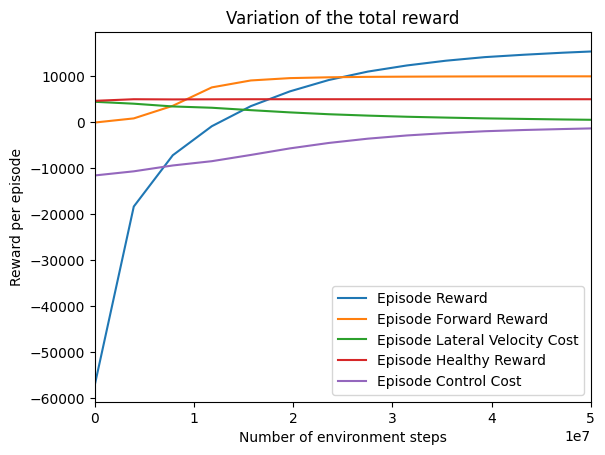

time to jit: 0:00:49.948214
time to train: 0:15:35.678891


In [15]:
#@title Training
from brax import envs
from brax.io import model
from brax.io import json
from brax.io import html
from brax.training.agents.ppo import train as ppo
from brax.training.agents.sac import train as sac

train_fn = functools.partial(ppo.train,  num_timesteps=50_000_000, num_evals=16, reward_scaling=10, episode_length=5000, normalize_observations=True, action_repeat=1, unroll_length=10, num_minibatches=32, num_updates_per_batch=4, discounting=0.97, learning_rate=3e-4, entropy_cost=1e-2, num_envs=4096, batch_size=2048, seed=1)

xdata, ydata = [], []
total_reward = []
forward_reward_data, lateral_reward_data, healthy_reward_data, control_reward_data = [], [], [], []
times = [datetime.now()]

def progress(num_steps, metrics):
  times.append(datetime.now())
  xdata.append(num_steps)
  total_reward.append(metrics['eval/episode_reward'])
  lateral_reward_data.append(metrics['eval/episode_reward_forward'])
  forward_reward_data.append(metrics['eval/episode_forward_reward'])
  healthy_reward_data.append(metrics['eval/episode_reward_survive'])
  control_reward_data.append(metrics['eval/episode_reward_ctrl'])
  clear_output(wait=True)
  plt.xlim([0, train_fn.keywords['num_timesteps']])
  plt.xlabel('Number of environment steps')
  plt.ylabel('Reward per episode')
  plt.plot(xdata, total_reward, label='Episode Reward')
  plt.plot(xdata, forward_reward_data, label='Episode Forward Reward')
  plt.plot(xdata, lateral_reward_data, label='Episode Lateral Velocity Cost')
  plt.plot(xdata, healthy_reward_data, label='Episode Healthy Reward')
  plt.plot(xdata, control_reward_data, label='Episode Control Cost')
  plt.title('Variation of the total reward')
  plt.legend()
  plt.show()

make_inference_fn, params, _ = train_fn(environment=env, progress_fn=progress)

print(f'time to jit: {times[1] - times[0]}')
print(f'time to train: {times[-1] - times[1]}')

# save params
model.save_params('/content/params', params)
params = model.load_params('/content/params')
inference_fn = make_inference_fn(params)

In [16]:
 #@title Visualizing a trajectory of the learned inference function
from brax import actuator

def transform_to_world(joint_pos, joint_rot, local_pos):
    # Extract quaternion components
    w, x, y, z = jp.array(joint_rot)

    # Compute the rotation matrix from quaternion [w, x, y, z]
    R = jp.array([[1 - 2*(y**2 + z**2), 2*(x*y - z*w), 2*(x*z + y*w)],
                   [2*(x*y + z*w), 1 - 2*(x**2 + z**2), 2*(y*z - x*w)],
                   [2*(x*z - y*w), 2*(y*z + x*w), 1 - 2*(x**2 + y**2)]])

    # Transform the local position to world coordinates
    world_pos = jp.dot(R, jp.array(local_pos)) + jp.array(joint_pos)

    return world_pos


# create an env with auto-reset
env = Ant(backend=backend)

jit_env_reset = jax.jit(env.reset)
jit_env_step = jax.jit(env.step)
jit_inference_fn = jax.jit(inference_fn)

rollout = []
actions = []

velocities, timesteps = [], []

x_positions = [[] for _ in range(19)]
y_positions = [[] for _ in range(19)]
z_positions = [[] for _ in range(19)]

body_x_positions = []
body_y_positions = []
body_z_positions = []

legs_pos = []

t_step = []
y_distance = []
y_vel = []

x_distance = []
z_distance = []
x_vel = []
z_vel = []

v_roll = []
v_pitch = []
v_yaw = []

joint_angles = []

# joint torque
tau = []

rng = jax.random.PRNGKey(seed=1)
state = jit_env_reset(rng=rng)
for i in range(5000):
  rollout.append(state.pipeline_state)

  t_step.append(i)
  y_distance.append(state.pipeline_state.x.pos[0, 1])
  y_vel.append(state.pipeline_state.xd.vel[0][1])

  x_distance.append(state.pipeline_state.x.pos[0, 0])
  x_vel.append(state.pipeline_state.xd.vel[0][0])
  z_vel.append(state.pipeline_state.xd.vel[0][2])
  z_distance.append(state.pipeline_state.x.pos[0, 2])

  # quaternion [w, x, y, z]
  w, x, y, z = state.pipeline_state.x.rot[0] # quaternion (unit quaternion)

  # Compute the rotation matrix R
  R = jp.array([
      [1 - 2*(y**2 + z**2), 2*(x*y - z*w), 2*(x*z + y*w)],
      [2*(x*y + z*w), 1 - 2*(x**2 + z**2), 2*(y*z - x*w)],
      [2*(x*z - y*w), 2*(y*z + x*w), 1 - 2*(x**2 + y**2)]
  ])

  # Calculate Euler angles (roll, pitch, yaw)
  roll = jp.arctan2(R[2, 1], R[2, 2])
  pitch = jp.arctan2(-R[2, 0], jp.sqrt(R[2, 1]**2 + R[2, 2]**2))
  yaw = jp.arctan2(R[1, 0], R[0, 0])

  # Convert to degrees if needed
  roll_deg = jp.degrees(roll)
  pitch_deg = jp.degrees(pitch)
  yaw_deg = jp.degrees(yaw)

  v_roll.append(roll_deg)
  v_pitch.append(pitch_deg)
  v_yaw.append(yaw_deg)

  joint_angles.append(np.concatenate([state.pipeline_state.q[7:13], state.pipeline_state.q[22:25]]))


  if i >= 4900:
    timesteps.append(i)
    velocities.append(state.pipeline_state.xd.vel[0][1])

    body_x_positions.append(state.pipeline_state.x.pos[0][0])
    body_y_positions.append(state.pipeline_state.x.pos[0][1])
    body_z_positions.append(state.pipeline_state.x.pos[0][2])

    leg_pos_y = []
    leg_pos_z = []

    for r in range(19) :
      leg_pos_y.append(state.pipeline_state.x.pos[r][1])
      leg_pos_z.append(state.pipeline_state.x.pos[r][2])

      if not(r == 0 or r%3 != 0) :
        legs_x_pos = state.pipeline_state.x.pos[r]
        legs_x_rot = state.pipeline_state.x.rot[r]
        leg_tip_pos = [0.0, 0.0, 0.0]
        if (r==3):
          leg_tip_pos = transform_to_world(legs_x_pos, legs_x_rot, [0.4, 0.4, 0.0])
        elif (r==6):
          leg_tip_pos = transform_to_world(legs_x_pos, legs_x_rot, [0.64, 0.0, 0.0])
        elif (r==9):
          leg_tip_pos = transform_to_world(legs_x_pos, legs_x_rot, [-0.64, 0.0, 0.0])
        elif (r==12):
          leg_tip_pos = transform_to_world(legs_x_pos, legs_x_rot, [-0.4, 0.4, 0.0])
        elif (r==15):
          leg_tip_pos = transform_to_world(legs_x_pos, legs_x_rot,[-0.4, -0.4, 0.0])
        else:
          leg_tip_pos = transform_to_world(legs_x_pos, legs_x_rot, [0.4, -0.4, 0.0])

        x_positions[r].append(leg_tip_pos[0])
        y_positions[r].append(leg_tip_pos[1])
        z_positions[r].append(leg_tip_pos[2])

        leg_pos_y.append(leg_tip_pos[1])
        leg_pos_z.append(leg_tip_pos[2])

    legs_pos.append([[leg_pos_y],[leg_pos_z]])

  act_rng, rng = jax.random.split(rng)
  act, _ = jit_inference_fn(state.obs, act_rng)
  state = jit_env_step(state, act)
  actions.append(act.tolist())

  tau.append(actuator.to_tau(env.sys, act, state.pipeline_state.q, state.pipeline_state.qd)[6:])

HTML(html.render(env.sys.tree_replace({'opt.timestep': env.dt}), rollout))


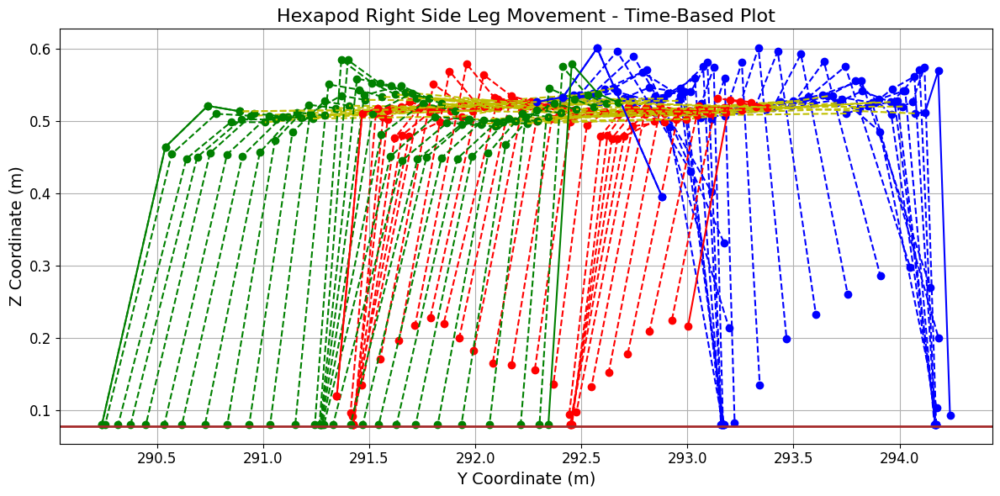

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

# Number of segments to plot (from legs_pos[0] to legs_pos[20])
num_legs = 30

# Create plot
plt.figure(figsize=(12, 6))

for i in range(0, num_legs, 1):
    # Extract scalar values correctly from nested structure
    x_vals = [np.array(x) for x in legs_pos[i][0]]  # first sublist = x-coords
    y_vals = [np.array(y) for y in legs_pos[i][1]]  # second sublist = y-coords

    plt.plot(x_vals[0][1:5], y_vals[0][1:5], 'bo--', label='Leg Trajectory')
    plt.plot(x_vals[0][5:9], y_vals[0][5:9], 'ro--', label='Leg Trajectory')
    plt.plot(x_vals[0][21:25], y_vals[0][21:25], 'go--', label='Leg Trajectory')
    x_connect = [x_vals[0][1], x_vals[0][5], x_vals[0][21]]
    y_connect = [y_vals[0][1], y_vals[0][5], y_vals[0][21]]
    plt.plot(x_connect, y_connect, 'y--', label='Key Connection')

# Extract scalar values correctly from nested structure
# begining
x_vals = [np.array(x) for x in legs_pos[0][0]]  # first sublist = x-coords
y_vals = [np.array(y) for y in legs_pos[0][1]]  # second sublist = y-coords

plt.plot(x_vals[0][1:5], y_vals[0][1:5], 'bo-', label='Leg Trajectory')
plt.plot(x_vals[0][5:9], y_vals[0][5:9], 'ro-', label='Leg Trajectory')
plt.plot(x_vals[0][21:25], y_vals[0][21:25], 'go-', label='Leg Trajectory')
x_connect = [x_vals[0][1], x_vals[0][5], x_vals[0][21]]
y_connect = [y_vals[0][1], y_vals[0][5], y_vals[0][21]]
plt.plot(x_connect, y_connect, 'y--', label='Key Connection')

# Extract scalar values correctly from nested structure
x_vals = [np.array(x) for x in legs_pos[num_legs][0]]  # first sublist = x-coords
y_vals = [np.array(y) for y in legs_pos[num_legs][1]]  # second sublist = y-coords

plt.plot(x_vals[0][1:5], y_vals[0][1:5], 'bo-', label='Leg Trajectory')
plt.plot(x_vals[0][5:9], y_vals[0][5:9], 'ro-', label='Leg Trajectory')
plt.plot(x_vals[0][21:25], y_vals[0][21:25], 'go-', label='Leg Trajectory')
x_connect = [x_vals[0][1], x_vals[0][5], x_vals[0][21]]
y_connect = [y_vals[0][1], y_vals[0][5], y_vals[0][21]]
plt.plot(x_connect, y_connect, 'y--', label='Key Connection')


# Final touches
plt.axhline(y=0.078, color='brown', linestyle='-', linewidth=2, label='y = 0.8')
plt.xlabel('Y Coordinate (m)', fontsize=14)
plt.ylabel('Z Coordinate (m)', fontsize=14)
plt.title('Hexapod Right Side Leg Movement - Time-Based Plot', fontsize=16)
plt.tick_params(axis='both', labelsize=12)  # Adjust 12 to your desired size

plt.grid(True)
plt.tight_layout()
plt.show()


In [18]:
from brax import actuator

tau1 = actuator.to_tau(env.sys, act, state.pipeline_state.q, state.pipeline_state.qd)

print(tau1[6:])

[-48.67926    21.745705   29.09021    22.059954  -21.138193  -15.965316
  25.974295   -9.245844   -7.4834576  34.600616  -52.860867    1.9004538
  15.364543  -38.636745   12.01749     8.975936   45.83711    76.3919   ]


In [19]:
state.pipeline_state.qd

Array([-0.02803802,  1.4526367 ,  0.07554293, -0.03732761,  0.02055688,
       -0.03063469, -1.4609432 , -0.6188822 ,  1.5566819 ,  0.5233489 ,
        0.00669355, -0.43052745,  0.10984403, -0.1980277 , -0.15455832,
       -0.43777665, -2.1532679 ,  1.6937776 ,  1.0304406 , -1.0123414 ,
        2.2336435 ,  0.9324394 , -1.3977269 ,  3.6278417 ], dtype=float32)

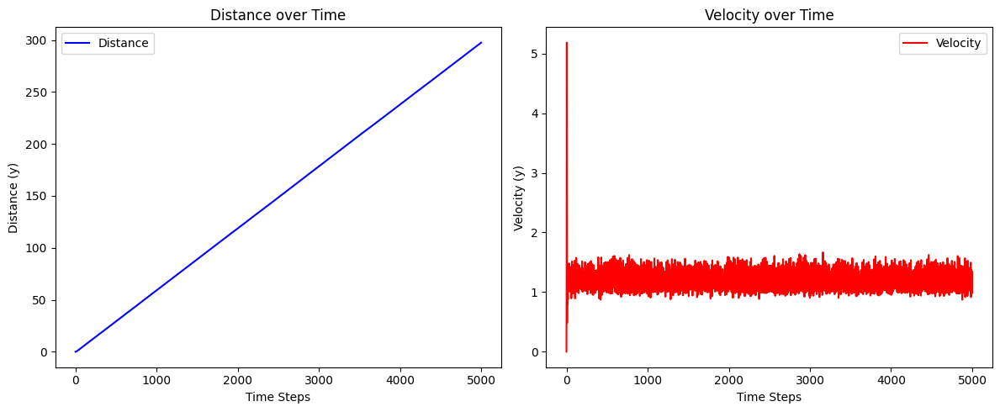

In [20]:
import matplotlib.pyplot as plt

# Assuming t_step, y_distance, and y_vel are populated lists
# Plotting distance over time
plt.figure(figsize=(12, 5))

# Distance plot
plt.subplot(1, 2, 1)
plt.plot(t_step, y_distance, label="Distance", color="b")
plt.xlabel("Time Steps")
plt.ylabel("Distance (y)")
plt.title("Distance over Time")
plt.legend()

# Velocity plot
plt.subplot(1, 2, 2)
plt.plot(t_step, y_vel, label="Velocity", color="r")
plt.xlabel("Time Steps")
plt.ylabel("Velocity (y)")
plt.title("Velocity over Time")
plt.legend()

plt.tight_layout()
plt.show()


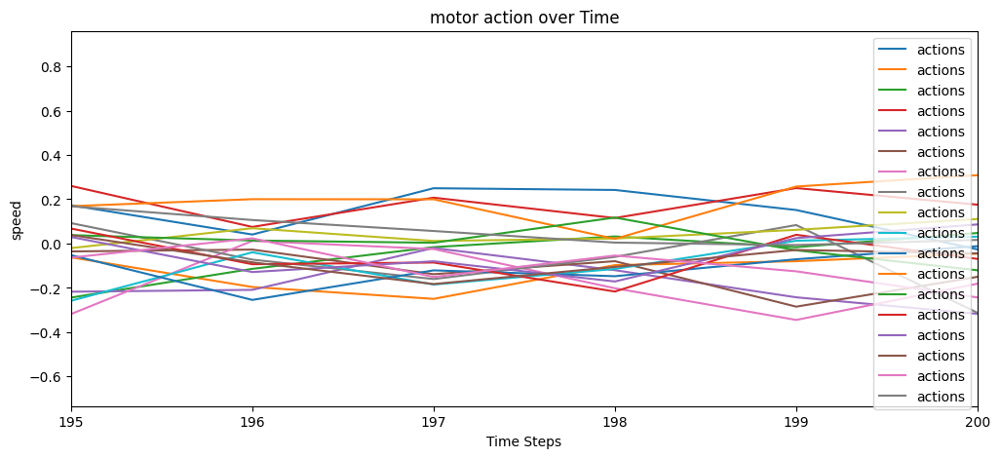

In [21]:
plt.figure(figsize=(12, 5))

plt.plot(t_step, actions, label="actions")
plt.xlabel("Time Steps")
plt.ylabel("speed")
plt.title("motor action over Time")
plt.xlim(195,200)
plt.legend(loc='upper right')


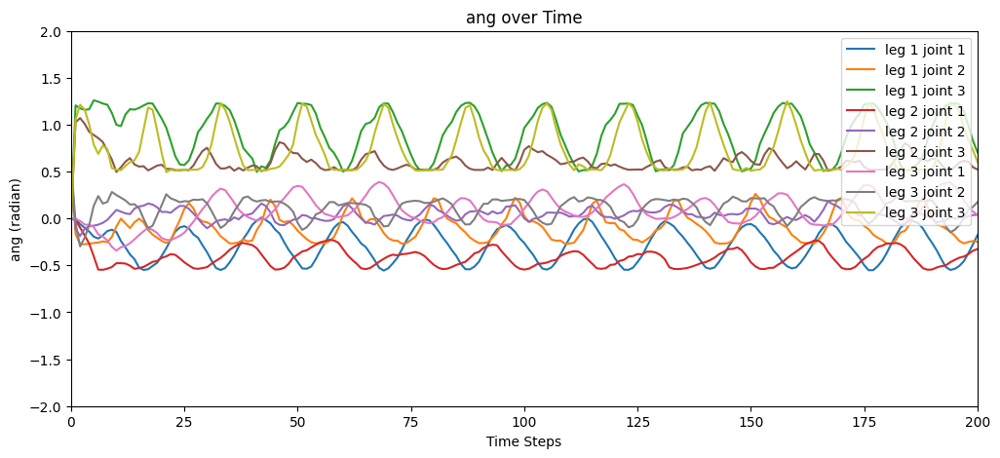

In [22]:
plt.figure(figsize=(12, 5))

plt.plot(t_step, joint_angles, label=["leg 1 joint 1","leg 1 joint 2","leg 1 joint 3", "leg 2 joint 1","leg 2 joint 2","leg 2 joint 3", "leg 3 joint 1","leg 3 joint 2","leg 3 joint 3"])
plt.xlabel("Time Steps")
plt.ylabel("ang (radian)")
plt.title("ang over Time")
plt.xlim(0,200)
plt.ylim(-2,2)
plt.legend(loc='upper right')

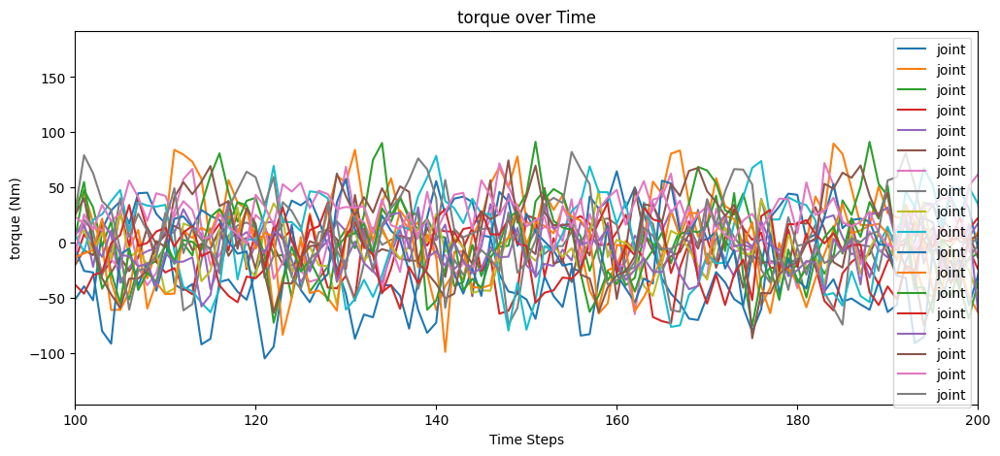

In [23]:
plt.figure(figsize=(12, 5))

plt.plot(t_step, tau, label="joint")
plt.xlabel("Time Steps")
plt.ylabel("torque (Nm)")
plt.title("torque over Time")
plt.xlim(100,200)
plt.legend(loc='upper right')

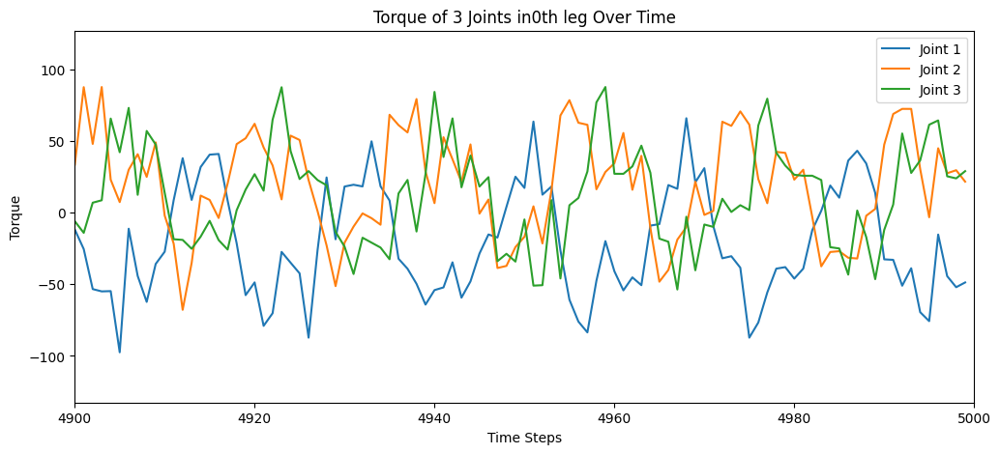

In [24]:
i =  1 - 1

tau_0 = [t[3*i+0] for t in tau]
tau_1 = [t[3*i+1] for t in tau]
tau_2 = [t[3*i+2] for t in tau]

# Create time steps if not already defined
# t_step = list(range(len(tau)))  # if t_step is not already defined

plt.figure(figsize=(12, 5))

plt.plot(t_step, tau_0, label="Joint 1")
plt.plot(t_step, tau_1, label="Joint 2")
plt.plot(t_step, tau_2, label="Joint 3")

plt.xlabel("Time Steps")
plt.ylabel("Torque")
plt.title("Torque of 3 Joints in"+ str(i) +"th leg Over Time")
plt.xlim(4900, 5000)
plt.legend(loc='upper right')
plt.show()

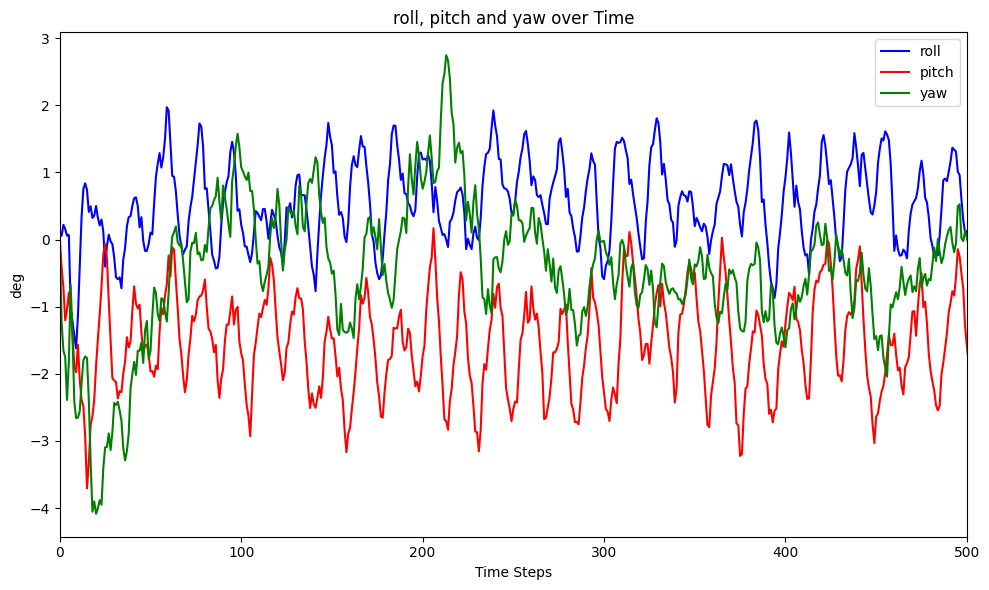

In [25]:
import matplotlib.pyplot as plt

# Assuming t_step, y_distance, and y_vel are populated lists
# Plotting distance over time
plt.figure(figsize=(10, 6))

# Distance plot
plt.subplot(1, 1, 1)
plt.plot(t_step, v_roll, label="roll", color="b")
plt.plot(t_step, v_pitch, label="pitch", color="r")
plt.plot(t_step, v_yaw, label="yaw", color="g")
plt.xlabel("Time Steps")
plt.ylabel("deg")
plt.title("roll, pitch and yaw over Time")
plt.xlim(0, 500)
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


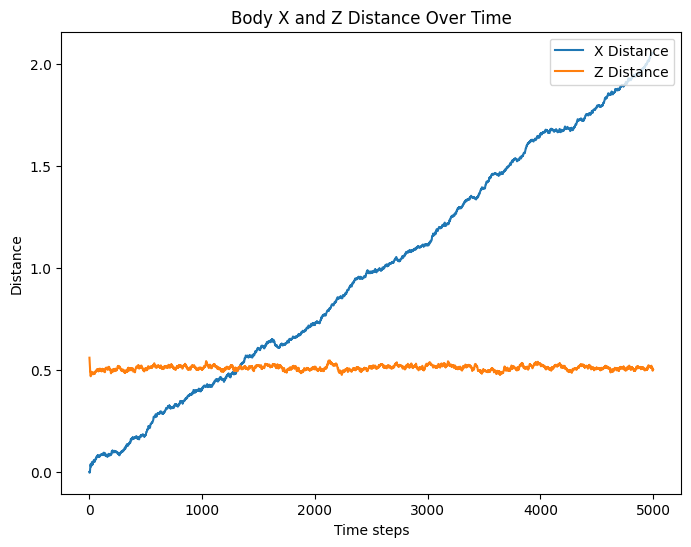

In [26]:
import matplotlib.pyplot as plt

# Plotting
plt.figure(figsize=(8, 6))
plt.plot(x_distance, label="X Distance")
plt.plot(z_distance, label="Z Distance")

# Adding labels, title, and legend
plt.xlabel("Time steps")
plt.ylabel("Distance")
plt.title("Body X and Z Distance Over Time")
plt.legend(loc='upper right')

# Show plot
plt.show()

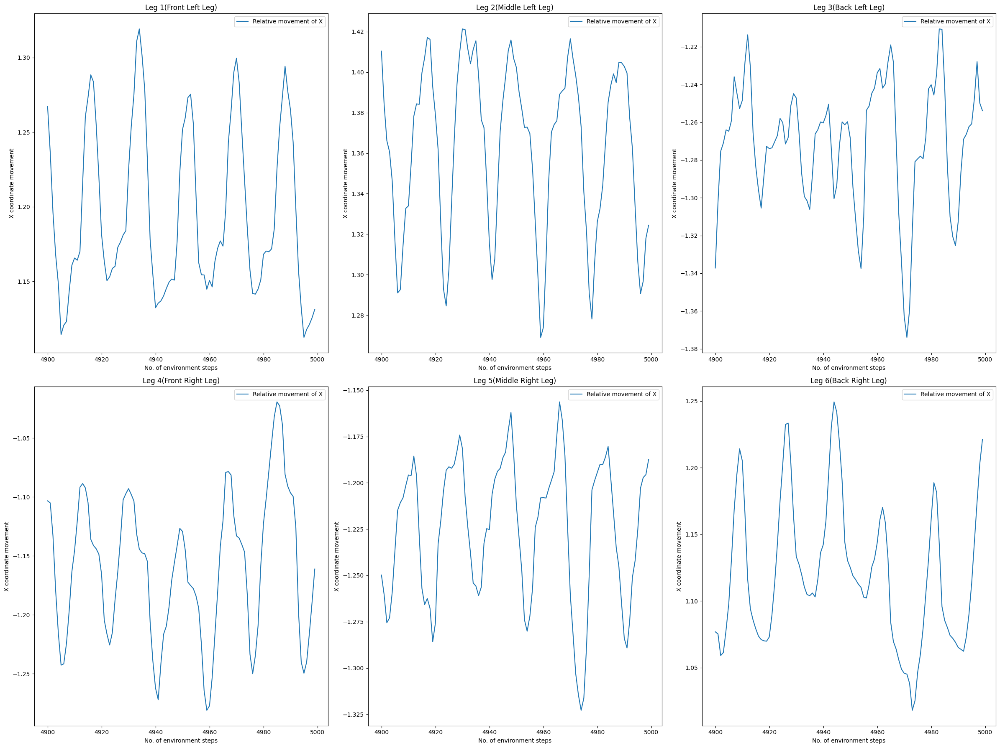

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# Creating 6 empty subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 18))

# Flattening the 2D array of axes for easier indexing
axes = axes.flatten()

j = 0
legs = ['Leg 1(Front Left Leg)', 'Leg 2(Middle Left Leg)', 'Leg 3(Back Left Leg)', 'Leg 4(Front Right Leg)', 'Leg 5(Middle Right Leg)', 'Leg 6(Back Right Leg)']
for i in range(19):
  if not(x_positions[i] == []) :  #consider positions of 3rd joints of legs
    relative_x = [x - y for x, y in zip(x_positions[i], body_x_positions)]
    axes[j].plot(timesteps, relative_x, label='Relative movement of X')
    # axes[j].plot(timesteps, x_positions[i], label='X movement - Leg', color = 'green',linestyle='dotted')
    # axes[j].plot(timesteps, body_x_positions, label='X movement - Body', color = 'orange',linestyle='dotted')
    axes[j].legend(loc='upper right')
    axes[j].set_title(legs[j])
    axes[j].set_xlabel('No. of environment steps')
    axes[j].set_ylabel('X coordinate movement')
    j += 1

# Adjusting layout
plt.tight_layout()

# Display the plots
plt.show()


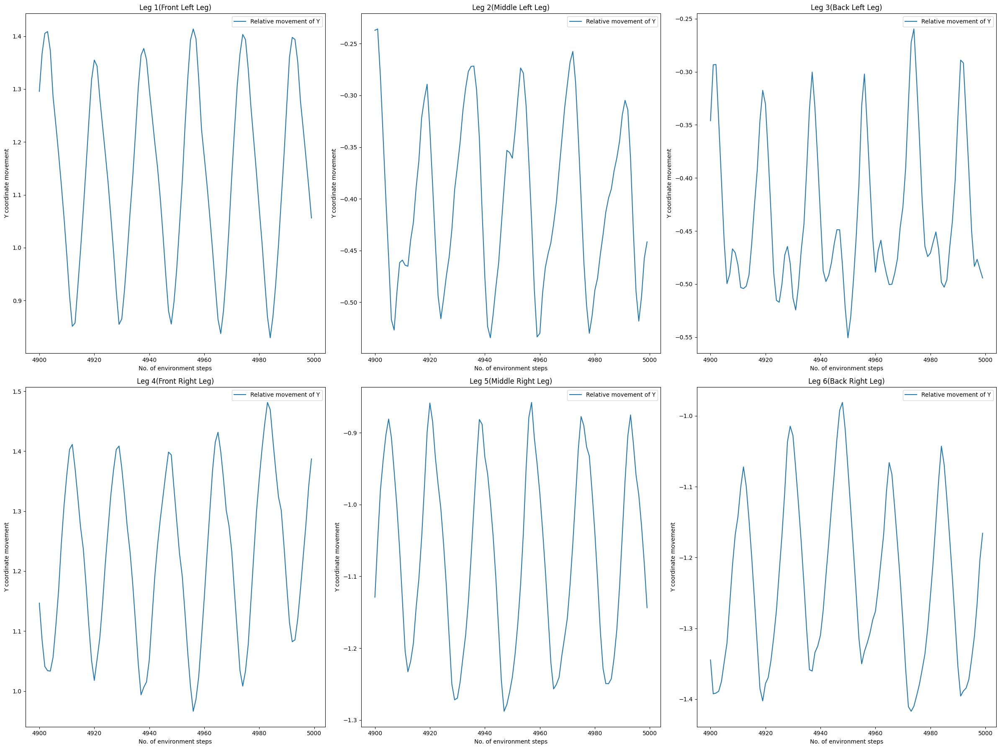

In [28]:
import matplotlib.pyplot as plt
import numpy as np

# Creating 6 empty subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 18))

# Flattening the 2D array of axes for easier indexing
axes = axes.flatten()

j = 0
legs = ['Leg 1(Front Left Leg)', 'Leg 2(Middle Left Leg)', 'Leg 3(Back Left Leg)', 'Leg 4(Front Right Leg)', 'Leg 5(Middle Right Leg)', 'Leg 6(Back Right Leg)']
for i in range(19):
  if not(y_positions[i] == []) :  #consider positions of 3rd joints of legs
    relative_y = [x - y for x, y in zip(y_positions[i], body_y_positions)]
    axes[j].plot(timesteps, relative_y, label='Relative movement of Y')
    # axes[j].plot(timesteps, y_positions[i], label='Y movement - Leg', color = 'green',linestyle='dotted')
    # axes[j].plot(timesteps, body_y_positions, label='Y movement - Body', color = 'orange',linestyle='dotted')
    axes[j].legend(loc='upper right')
    axes[j].set_title(legs[j])
    axes[j].set_xlabel('No. of environment steps')
    axes[j].set_ylabel('Y coordinate movement')
    j += 1

# Adjusting layout
plt.tight_layout()

# Display the plots
plt.show()

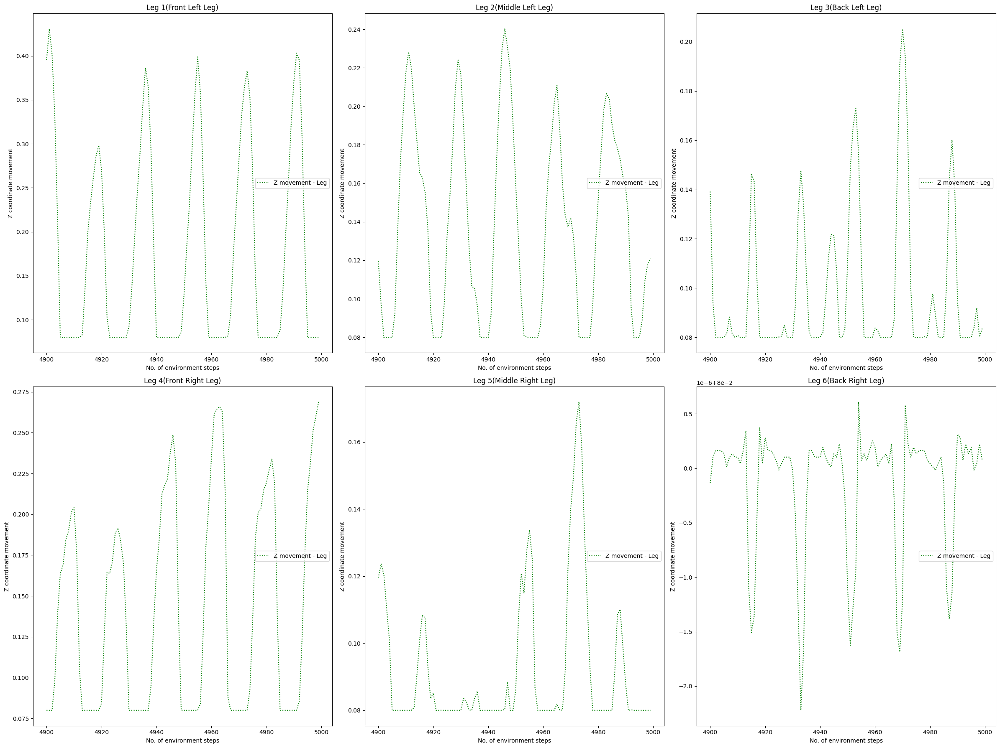

In [29]:
import matplotlib.pyplot as plt
import numpy as np

# Creating 6 empty subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 18))

# Flattening the 2D array of axes for easier indexing
axes = axes.flatten()

legs_z_position = []

j = 0
legs = ['Leg 1(Front Left Leg)', 'Leg 2(Middle Left Leg)', 'Leg 3(Back Left Leg)', 'Leg 4(Front Right Leg)', 'Leg 5(Middle Right Leg)', 'Leg 6(Back Right Leg)']
for i in range(19):
  if not(z_positions[i] == []) :  #consider positions of 3rd joints of legs
    relative_z = [x - y for x, y in zip(z_positions[i], body_z_positions)]
    legs_z_position.append(z_positions[i])
    # axes[j].plot(timesteps, relative_z, label='Relative movement of Z')
    axes[j].plot(timesteps, z_positions[i], label='Z movement - Leg', color = 'green',linestyle='dotted')
    # axes[j].plot(timesteps, body_z_positions, label='Z movement - Body', color = 'orange',linestyle='dotted')
    axes[j].legend(loc='center right')
    axes[j].set_title(legs[j])
    axes[j].set_xlabel('No. of environment steps')
    axes[j].set_ylabel('Z coordinate movement')
    j += 1

# Adjusting layout
plt.tight_layout()

# Display the plots
plt.show()


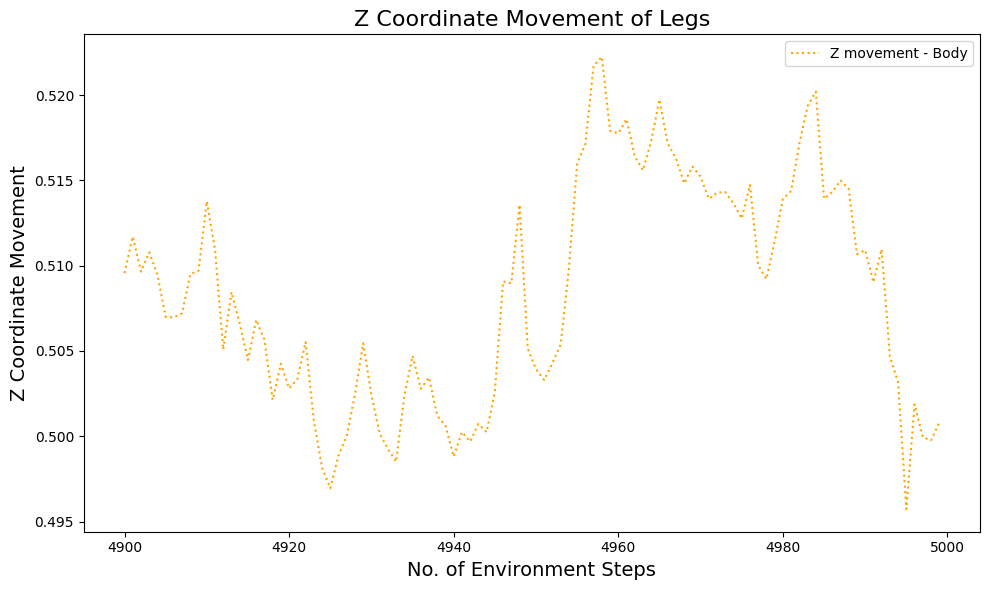

In [30]:

import matplotlib.pyplot as plt
import numpy as np

# Create a single plot
plt.figure(figsize=(10, 6))

plt.plot(timesteps, body_z_positions, label='Z movement - Body', color = 'orange',linestyle='dotted')

# Adding legend, title, and labels
plt.legend(loc='upper right')
plt.title('Z Coordinate Movement of Legs', fontsize=16)
plt.xlabel('No. of Environment Steps', fontsize=14)
plt.ylabel('Z Coordinate Movement', fontsize=14)

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()


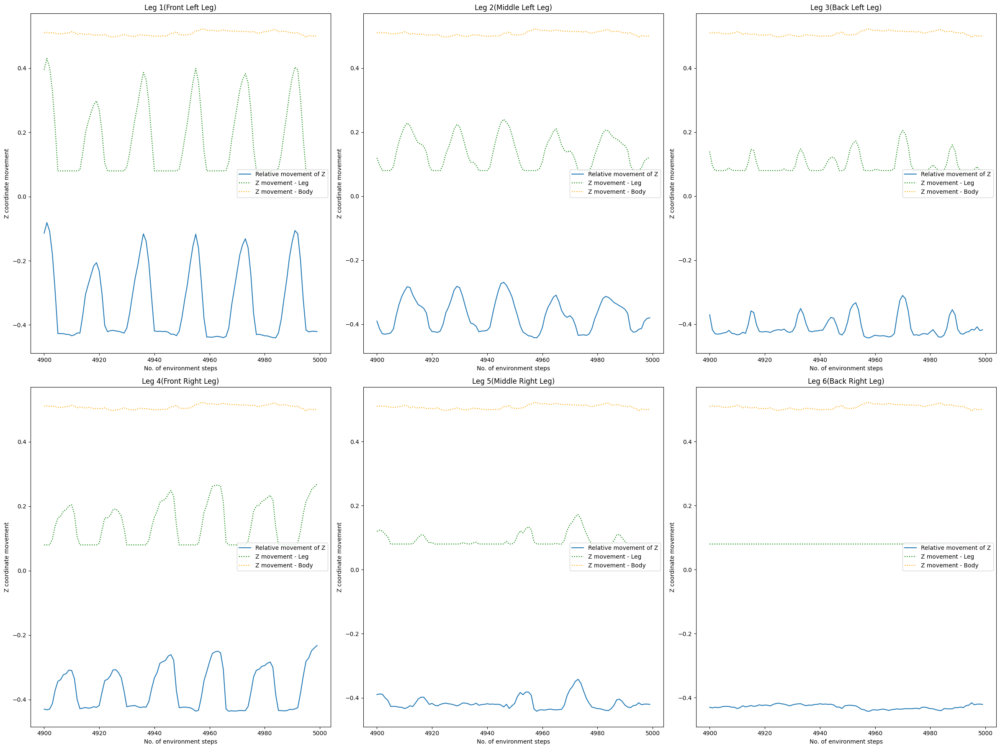

In [31]:
import matplotlib.pyplot as plt
import numpy as np

# Creating 6 empty subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 18))

# Flattening the 2D array of axes for easier indexing
axes = axes.flatten()

legs_z_position = []

j = 0
legs = ['Leg 1(Front Left Leg)', 'Leg 2(Middle Left Leg)', 'Leg 3(Back Left Leg)', 'Leg 4(Front Right Leg)', 'Leg 5(Middle Right Leg)', 'Leg 6(Back Right Leg)']
for i in range(19):
  if not(z_positions[i] == []) :  #consider positions of 3rd joints of legs
    relative_z = [x - y for x, y in zip(z_positions[i], body_z_positions)]
    legs_z_position.append(z_positions[i])
    axes[j].plot(timesteps, relative_z, label='Relative movement of Z')
    axes[j].plot(timesteps, z_positions[i], label='Z movement - Leg', color = 'green',linestyle='dotted')
    axes[j].plot(timesteps, body_z_positions, label='Z movement - Body', color = 'orange',linestyle='dotted')
    axes[j].legend(loc='center right')
    axes[j].set_title(legs[j])
    axes[j].set_xlabel('No. of environment steps')
    axes[j].set_ylabel('Z coordinate movement')
    j += 1

# Adjusting layout
plt.tight_layout()

# Display the plots
plt.show()


In [32]:
# Define thresholds and corresponding legs
thresholds = [0.081, 0.081, 0.081, 0.081, 0.081, 0.081]
legs = [
    'Leg 1 (Front Left)',
    'Leg 2 (Middle Left)',
    'Leg 5 (Middle Right)',
    'Leg 4 (Front Right)',
    'Leg 6 (Back Right)',
    'Leg 3 (Back Left)'
]
legs_z_positions = np.array(legs_z_position) - np.array(thresholds)[:, np.newaxis]

new_legs_z_positions = legs_z_positions


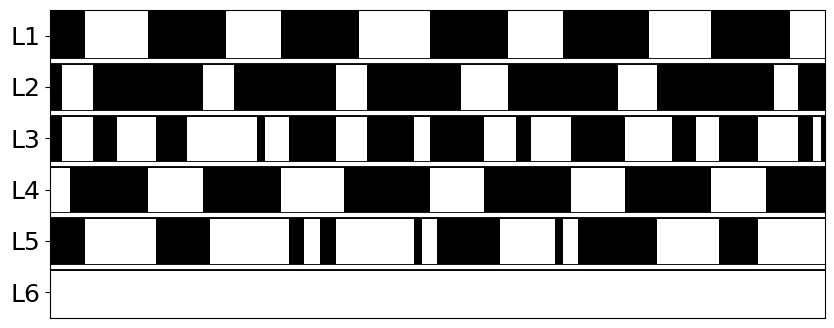

In [33]:
binary_grid = np.where(new_legs_z_positions > 0, 0, 1)  # Convert to binary grid
legs = [
    'L1',
    'L2',
    'L3',
    'L4',
    'L5',
    'L6'
]


# Plot with original dimensions and leg names
plt.figure(figsize=(10, 4))  # Adjust figure size
plt.imshow(binary_grid, cmap='gray', interpolation='nearest', aspect='auto')  # Black = 1, White = 0

# Add borders around each row
for i in range(binary_grid.shape[0]-1):
    i+=1
    plt.plot([0, binary_grid.shape[1]], [i-0.5, i-0.5], color='black', lw=5)  # Horizontal borders
for i in range(binary_grid.shape[0]-1):
    i+=1
    plt.plot([0, binary_grid.shape[1]], [i-0.5, i-0.5], color='white', lw=3)  # Horizontal borders

plt.xticks([])  # Remove X-axis ticks
plt.xlim(0, binary_grid.shape[1]-1)
plt.yticks(ticks=np.arange(len(legs)), labels=legs, fontsize=18)  # Add Y-axis ticks with leg names
# plt.title("Gait Pattern")
# Save the plot as a vector graphic
plt.savefig("W.svg", format='svg')
plt.show()

# black swing phase, white stance phase

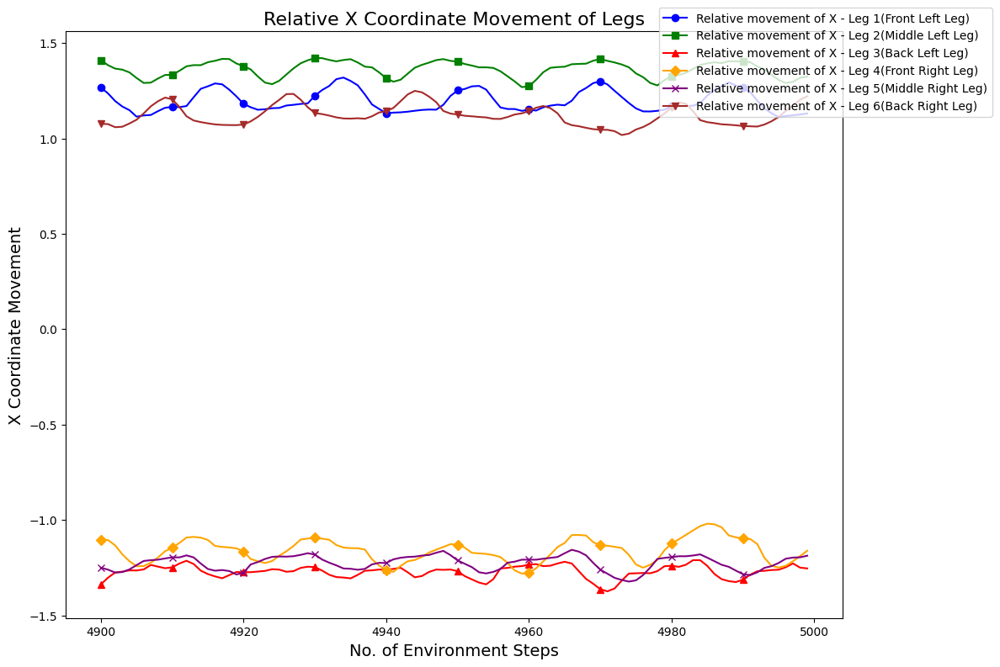

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Create a single plot
plt.figure(figsize=(12, 8))

# List of leg names
legs = ['Leg 1(Front Left Leg)', 'Leg 2(Middle Left Leg)', 'Leg 3(Back Left Leg)', 'Leg 4(Front Right Leg)', 'Leg 5(Middle Right Leg)', 'Leg 6(Back Right Leg)']

# Define unique markers and colors for each leg
markers = ['o', 's', '^', 'D', 'x', 'v']
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

j = 0
for i in range(19):
    if not (x_positions[i] == []):  # Consider positions of 3rd joints of legs
        relative_x = [x - y for x, y in zip(x_positions[i], body_x_positions)]
        plt.plot(
            timesteps, relative_x,
            label=f'Relative movement of X - {legs[j]}',
            color=colors[j], marker=markers[j], markevery=10
        )
        j += 1

# Adding legend, title, and labels
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.05))
plt.title('Relative X Coordinate Movement of Legs', fontsize=16)
plt.xlabel('No. of Environment Steps', fontsize=14)
plt.ylabel('X Coordinate Movement', fontsize=14)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg_x_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()


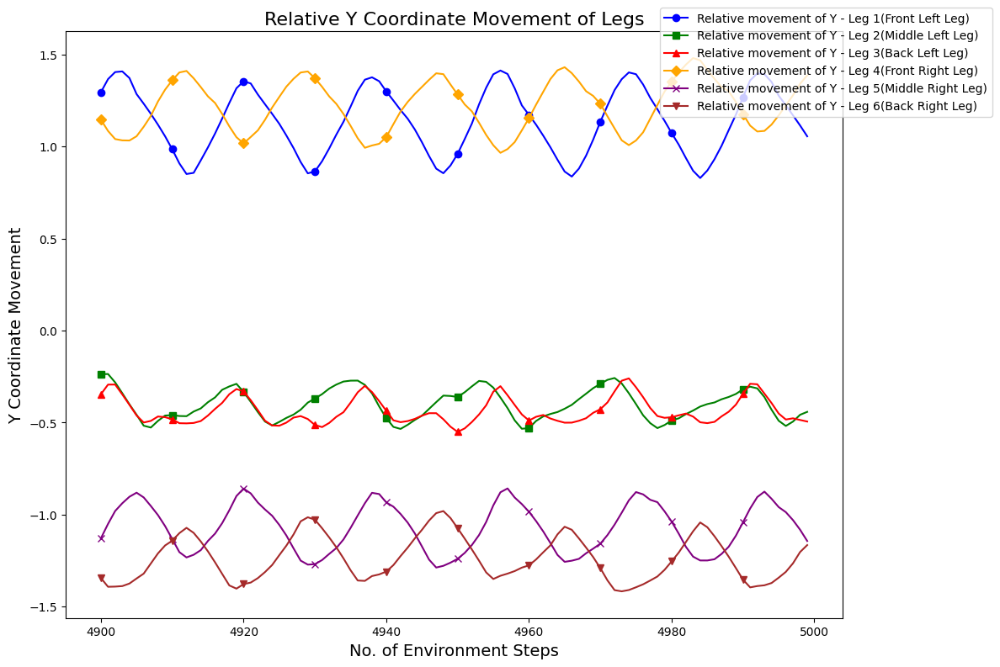

In [35]:
import matplotlib.pyplot as plt
import numpy as np

# Create a single plot
plt.figure(figsize=(12, 8))

# List of leg names
legs = ['Leg 1(Front Left Leg)', 'Leg 2(Middle Left Leg)', 'Leg 3(Back Left Leg)', 'Leg 4(Front Right Leg)', 'Leg 5(Middle Right Leg)', 'Leg 6(Back Right Leg)']

# Define unique markers and colors for each leg
markers = ['o', 's', '^', 'D', 'x', 'v']
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

j = 0
for i in range(19):
    if not (y_positions[i] == []):  # Consider positions of 3rd joints of legs
        relative_x = [x - y for x, y in zip(y_positions[i], body_y_positions)]
        plt.plot(
            timesteps, relative_x,
            label=f'Relative movement of Y - {legs[j]}',
            color=colors[j], marker=markers[j], markevery=10
        )
        j += 1

# Adding legend, title, and labels
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.05))
plt.title('Relative Y Coordinate Movement of Legs', fontsize=16)
plt.xlabel('No. of Environment Steps', fontsize=14)
plt.ylabel('Y Coordinate Movement', fontsize=14)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg_y_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()


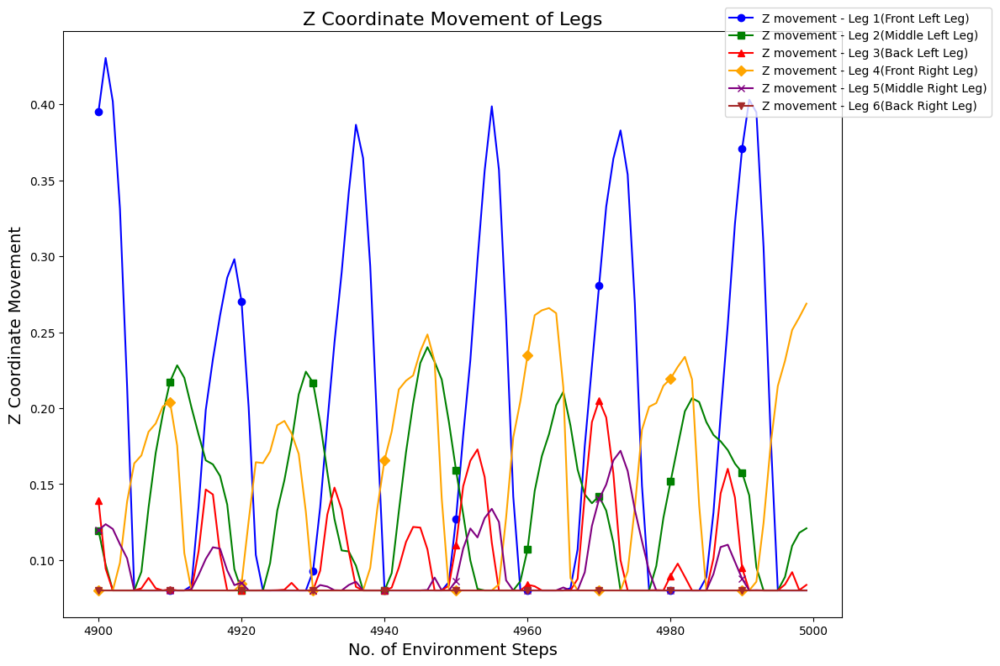

In [36]:


import matplotlib.pyplot as plt
import numpy as np

# Create a single plot
plt.figure(figsize=(12, 8))

# List of leg names
legs = ['Leg 1(Front Left Leg)', 'Leg 2(Middle Left Leg)', 'Leg 3(Back Left Leg)', 'Leg 4(Front Right Leg)', 'Leg 5(Middle Right Leg)', 'Leg 6(Back Right Leg)']

# Define unique markers and colors for each leg
markers = ['o', 's', '^', 'D', 'x', 'v']
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown']

j = 0
for i in range(19):
    if not (z_positions[i] == []):  # Consider positions of 3rd joints of legs
        plt.plot(
            timesteps, z_positions[i],
            label=f'Z movement - {legs[j]}',
            color=colors[j], marker=markers[j], markevery=10
        )
        j += 1

# Adding legend, title, and labels
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.05))
plt.title('Z Coordinate Movement of Legs', fontsize=16)
plt.xlabel('No. of Environment Steps', fontsize=14)
plt.ylabel('Z Coordinate Movement', fontsize=14)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg_z_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()


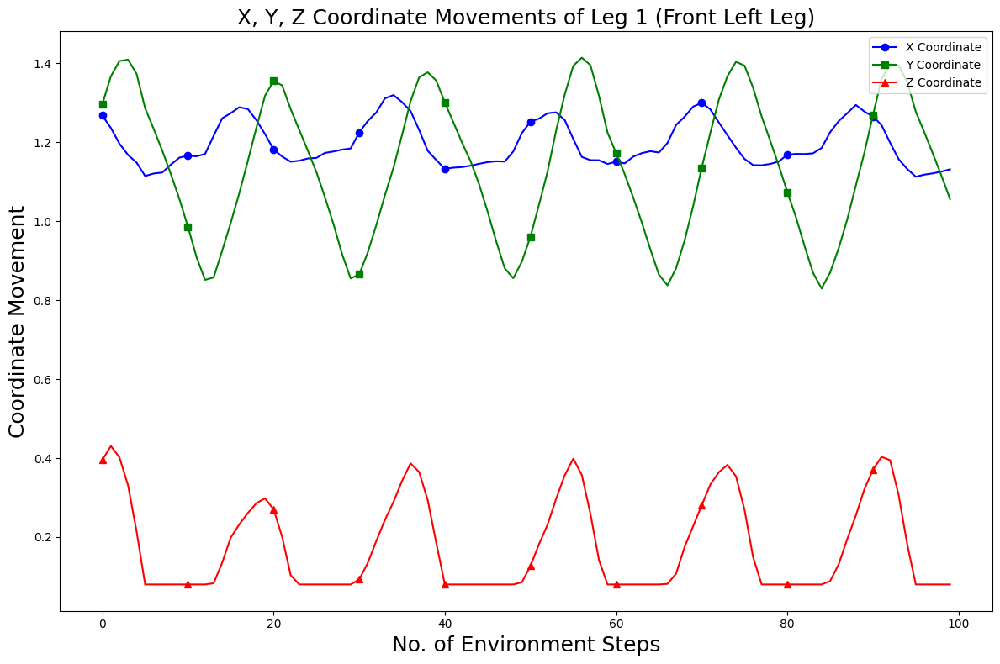

[Array(1.2672894, dtype=float32), Array(1.235912, dtype=float32), Array(1.196061, dtype=float32), Array(1.167576, dtype=float32), Array(1.1482028, dtype=float32), Array(1.1142677, dtype=float32), Array(1.1205595, dtype=float32), Array(1.1230313, dtype=float32), Array(1.143057, dtype=float32), Array(1.1607566, dtype=float32), Array(1.1655812, dtype=float32), Array(1.1641235, dtype=float32), Array(1.1699978, dtype=float32), Array(1.2159342, dtype=float32), Array(1.2602973, dtype=float32), Array(1.273381, dtype=float32), Array(1.2883834, dtype=float32), Array(1.2836837, dtype=float32), Array(1.2553627, dtype=float32), Array(1.2203538, dtype=float32), Array(1.1814698, dtype=float32), Array(1.1635351, dtype=float32), Array(1.1504197, dtype=float32), Array(1.152984, dtype=float32), Array(1.1585916, dtype=float32), Array(1.1600384, dtype=float32), Array(1.1726879, dtype=float32), Array(1.1762886, dtype=float32), Array(1.1810153, dtype=float32), Array(1.1839188, dtype=float32), Array(1.2243121

In [37]:
import matplotlib.pyplot as plt

# Create a single plot
plt.figure(figsize=(12, 8))

# Data for Leg 1 (Front Left Leg)
leg_index = 3  # Assuming Leg 1 corresponds to index 0
timesteps = range(len(x_positions[leg_index]))  # Adjust this to match your timestep array

# Define unique markers and colors for x, y, and z coordinates
markers = ['o', 's', '^']
colors = ['blue', 'green', 'red']
labels = ['X Coordinate', 'Y Coordinate', 'Z Coordinate']

# Plotting X, Y, and Z coordinates
relative_x = [x - y for x, y in zip(x_positions[leg_index], body_x_positions)]
relative_y = [x - y for x, y in zip(y_positions[leg_index], body_y_positions)]
z_coord = z_positions[leg_index]  # Direct Z coordinates

# Plotting each coordinate
plt.plot(timesteps, relative_x, label=labels[0], color=colors[0], marker=markers[0], markevery=10)
plt.plot(timesteps, relative_y, label=labels[1], color=colors[1], marker=markers[1], markevery=10)
plt.plot(timesteps, z_coord, label=labels[2], color=colors[2], marker=markers[2], markevery=10)

# Adding legend, title, and labels
plt.legend(loc='upper right')
plt.title('X, Y, Z Coordinate Movements of Leg 1 (Front Left Leg)', fontsize=18)
plt.xlabel('No. of Environment Steps', fontsize=18)
plt.ylabel('Coordinate Movement', fontsize=18)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg1_xyz_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()

print(relative_x)
print("------------")
print(relative_y)
print("------------")
print(z_coord)

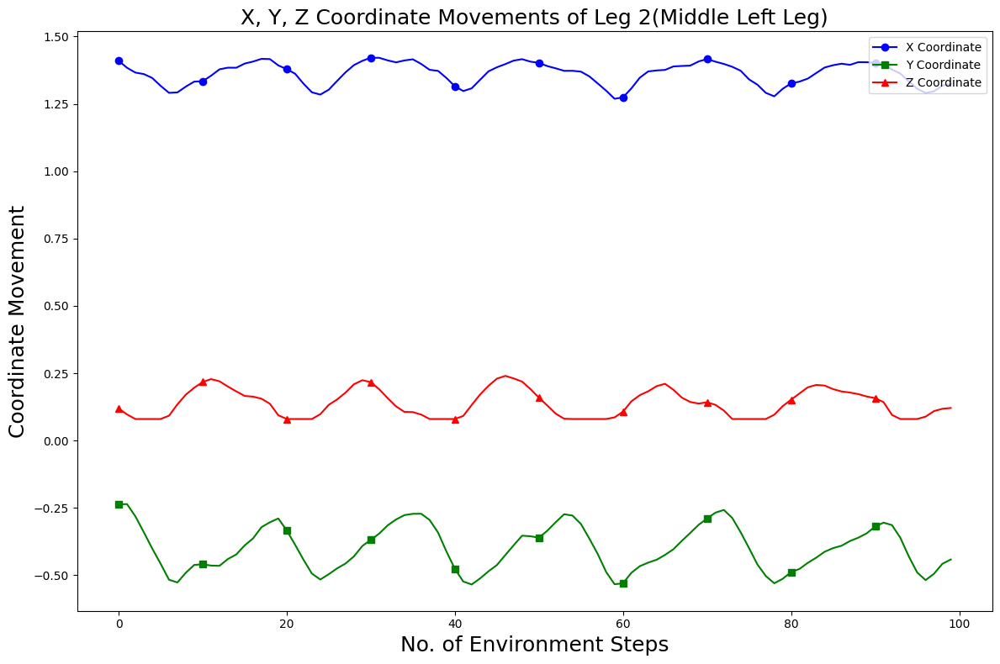

[Array(1.4104183, dtype=float32), Array(1.384082, dtype=float32), Array(1.3661915, dtype=float32), Array(1.3606852, dtype=float32), Array(1.3462487, dtype=float32), Array(1.3168925, dtype=float32), Array(1.290937, dtype=float32), Array(1.2926003, dtype=float32), Array(1.3141795, dtype=float32), Array(1.3326938, dtype=float32), Array(1.3339555, dtype=float32), Array(1.3545303, dtype=float32), Array(1.3782421, dtype=float32), Array(1.3843523, dtype=float32), Array(1.3841176, dtype=float32), Array(1.3996408, dtype=float32), Array(1.4071256, dtype=float32), Array(1.417122, dtype=float32), Array(1.4162297, dtype=float32), Array(1.3928201, dtype=float32), Array(1.3789529, dtype=float32), Array(1.3618643, dtype=float32), Array(1.3248513, dtype=float32), Array(1.2928439, dtype=float32), Array(1.2844967, dtype=float32), Array(1.3024904, dtype=float32), Array(1.335342, dtype=float32), Array(1.3672662, dtype=float32), Array(1.3939891, dtype=float32), Array(1.4097697, dtype=float32), Array(1.42136

In [38]:
import matplotlib.pyplot as plt

# Create a single plot
plt.figure(figsize=(12, 8))

# Data for Leg 1 (Front Left Leg)
leg_index = 6 # Assuming Leg 1 corresponds to index 0
timesteps = range(len(x_positions[leg_index]))  # Adjust this to match your timestep array

# Define unique markers and colors for x, y, and z coordinates
markers = ['o', 's', '^']
colors = ['blue', 'green', 'red']
labels = ['X Coordinate', 'Y Coordinate', 'Z Coordinate']

# Plotting X, Y, and Z coordinates
relative_x = [x - y for x, y in zip(x_positions[leg_index], body_x_positions)]
relative_y = [x - y for x, y in zip(y_positions[leg_index], body_y_positions)]
z_coord = z_positions[leg_index]  # Direct Z coordinates

# Plotting each coordinate
plt.plot(timesteps, relative_x, label=labels[0], color=colors[0], marker=markers[0], markevery=10)
plt.plot(timesteps, relative_y, label=labels[1], color=colors[1], marker=markers[1], markevery=10)
plt.plot(timesteps, z_coord, label=labels[2], color=colors[2], marker=markers[2], markevery=10)

# Adding legend, title, and labels
plt.legend(loc='upper right')
plt.title('X, Y, Z Coordinate Movements of Leg 2(Middle Left Leg)', fontsize=18)
plt.xlabel('No. of Environment Steps', fontsize=18)
plt.ylabel('Coordinate Movement', fontsize=18)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg2_xyz_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()

print(relative_x)
print("------------")
print(relative_y)
print("------------")
print(z_coord)

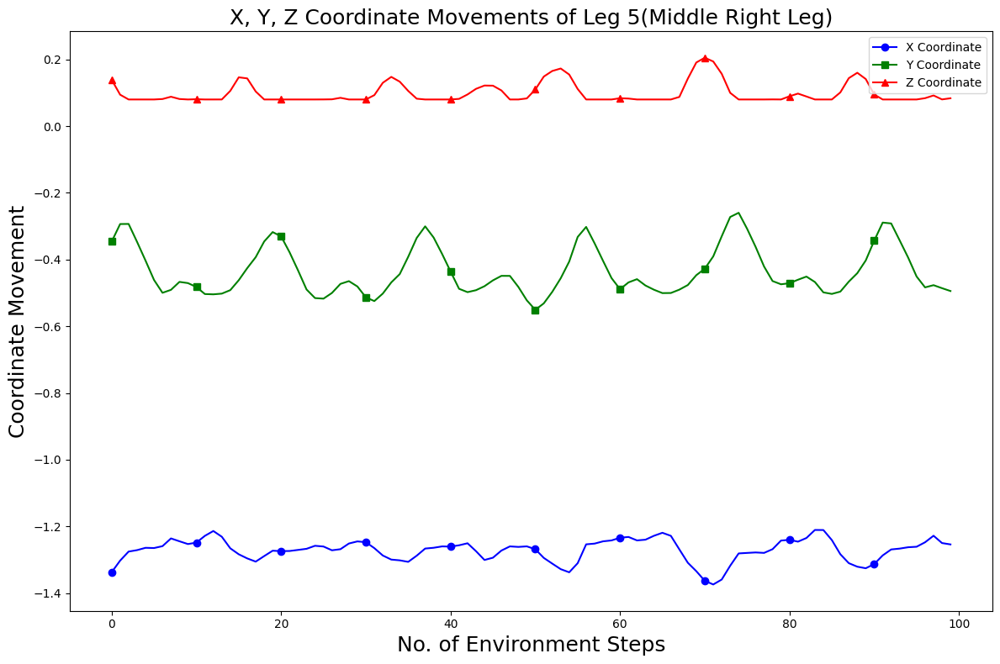

[Array(-1.3372136, dtype=float32), Array(-1.3023958, dtype=float32), Array(-1.2753258, dtype=float32), Array(-1.2709732, dtype=float32), Array(-1.264024, dtype=float32), Array(-1.2647345, dtype=float32), Array(-1.2590498, dtype=float32), Array(-1.2358828, dtype=float32), Array(-1.2444572, dtype=float32), Array(-1.2527652, dtype=float32), Array(-1.2484245, dtype=float32), Array(-1.2281957, dtype=float32), Array(-1.2136528, dtype=float32), Array(-1.23087, dtype=float32), Array(-1.265554, dtype=float32), Array(-1.2834629, dtype=float32), Array(-1.29581, dtype=float32), Array(-1.3054535, dtype=float32), Array(-1.2888722, dtype=float32), Array(-1.2727325, dtype=float32), Array(-1.2739309, dtype=float32), Array(-1.2735585, dtype=float32), Array(-1.2703285, dtype=float32), Array(-1.2670327, dtype=float32), Array(-1.2579609, dtype=float32), Array(-1.2601624, dtype=float32), Array(-1.2714815, dtype=float32), Array(-1.2681766, dtype=float32), Array(-1.2511317, dtype=float32), Array(-1.2448397, d

In [39]:
import matplotlib.pyplot as plt

# Create a single plot
plt.figure(figsize=(12, 8))

# Data for Leg 1 (Front Left Leg)
leg_index = 9 # Assuming Leg 1 corresponds to index 0
timesteps = range(len(x_positions[leg_index]))  # Adjust this to match your timestep array

# Define unique markers and colors for x, y, and z coordinates
markers = ['o', 's', '^']
colors = ['blue', 'green', 'red']
labels = ['X Coordinate', 'Y Coordinate', 'Z Coordinate']

# Plotting X, Y, and Z coordinates
relative_x = [x - y for x, y in zip(x_positions[leg_index], body_x_positions)]
relative_y = [x - y for x, y in zip(y_positions[leg_index], body_y_positions)]
z_coord = z_positions[leg_index]  # Direct Z coordinates

# Plotting each coordinate
plt.plot(timesteps, relative_x, label=labels[0], color=colors[0], marker=markers[0], markevery=10)
plt.plot(timesteps, relative_y, label=labels[1], color=colors[1], marker=markers[1], markevery=10)
plt.plot(timesteps, z_coord, label=labels[2], color=colors[2], marker=markers[2], markevery=10)

# Adding legend, title, and labels
plt.legend(loc='upper right')
plt.title('X, Y, Z Coordinate Movements of Leg 5(Middle Right Leg)', fontsize=18)
plt.xlabel('No. of Environment Steps', fontsize=18)
plt.ylabel('Coordinate Movement', fontsize=18)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg2_xyz_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()

print(relative_x)
print("------------")
print(relative_y)
print("------------")
print(z_coord)

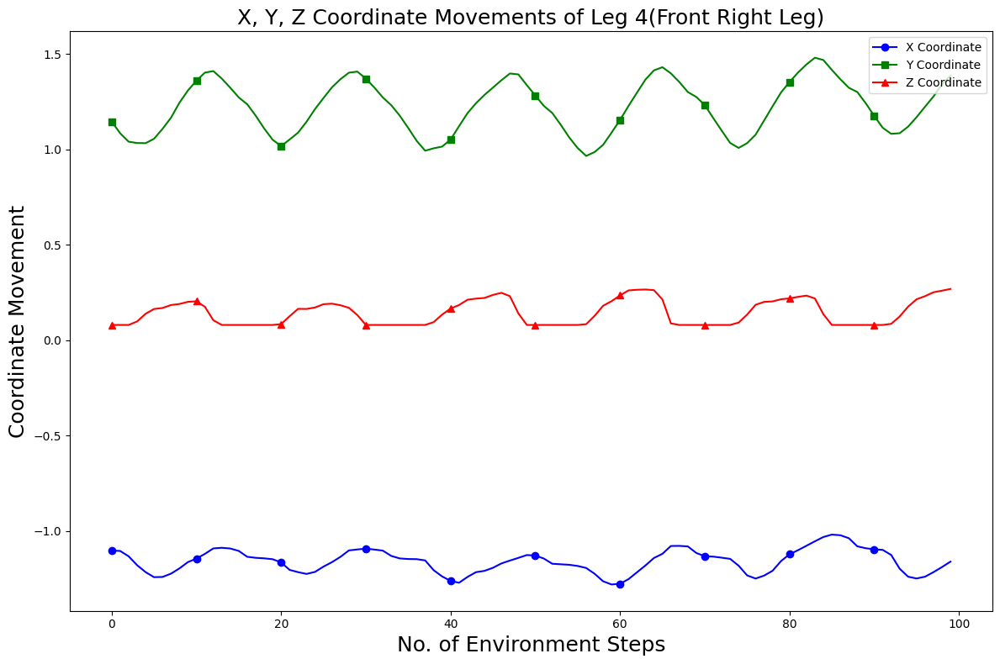

[Array(-1.1033683, dtype=float32), Array(-1.1051496, dtype=float32), Array(-1.133157, dtype=float32), Array(-1.1798126, dtype=float32), Array(-1.2160208, dtype=float32), Array(-1.2427084, dtype=float32), Array(-1.2416266, dtype=float32), Array(-1.2242945, dtype=float32), Array(-1.1967525, dtype=float32), Array(-1.163584, dtype=float32), Array(-1.1455598, dtype=float32), Array(-1.1205747, dtype=float32), Array(-1.0917912, dtype=float32), Array(-1.0886669, dtype=float32), Array(-1.0923947, dtype=float32), Array(-1.1049604, dtype=float32), Array(-1.1359162, dtype=float32), Array(-1.1412113, dtype=float32), Array(-1.1439848, dtype=float32), Array(-1.1485839, dtype=float32), Array(-1.1654656, dtype=float32), Array(-1.2044576, dtype=float32), Array(-1.2163574, dtype=float32), Array(-1.2256378, dtype=float32), Array(-1.215087, dtype=float32), Array(-1.1873716, dtype=float32), Array(-1.1639475, dtype=float32), Array(-1.1360886, dtype=float32), Array(-1.1024524, dtype=float32), Array(-1.097316,

In [40]:
import matplotlib.pyplot as plt

# Create a single plot
plt.figure(figsize=(12, 8))

# Data for Leg 1 (Front Left Leg)
leg_index = 12 # Assuming Leg 1 corresponds to index 0
timesteps = range(len(x_positions[leg_index]))  # Adjust this to match your timestep array

# Define unique markers and colors for x, y, and z coordinates
markers = ['o', 's', '^']
colors = ['blue', 'green', 'red']
labels = ['X Coordinate', 'Y Coordinate', 'Z Coordinate']

# Plotting X, Y, and Z coordinates
relative_x = [x - y for x, y in zip(x_positions[leg_index], body_x_positions)]
relative_y = [x - y for x, y in zip(y_positions[leg_index], body_y_positions)]
z_coord = z_positions[leg_index]  # Direct Z coordinates

# Plotting each coordinate
plt.plot(timesteps, relative_x, label=labels[0], color=colors[0], marker=markers[0], markevery=10)
plt.plot(timesteps, relative_y, label=labels[1], color=colors[1], marker=markers[1], markevery=10)
plt.plot(timesteps, z_coord, label=labels[2], color=colors[2], marker=markers[2], markevery=10)

# Adding legend, title, and labels
plt.legend(loc='upper right')
plt.title('X, Y, Z Coordinate Movements of Leg 4(Front Right Leg)', fontsize=18)
plt.xlabel('No. of Environment Steps', fontsize=18)
plt.ylabel('Coordinate Movement', fontsize=18)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg2_xyz_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()

print(relative_x)
print("------------")
print(relative_y)
print("------------")
print(z_coord)

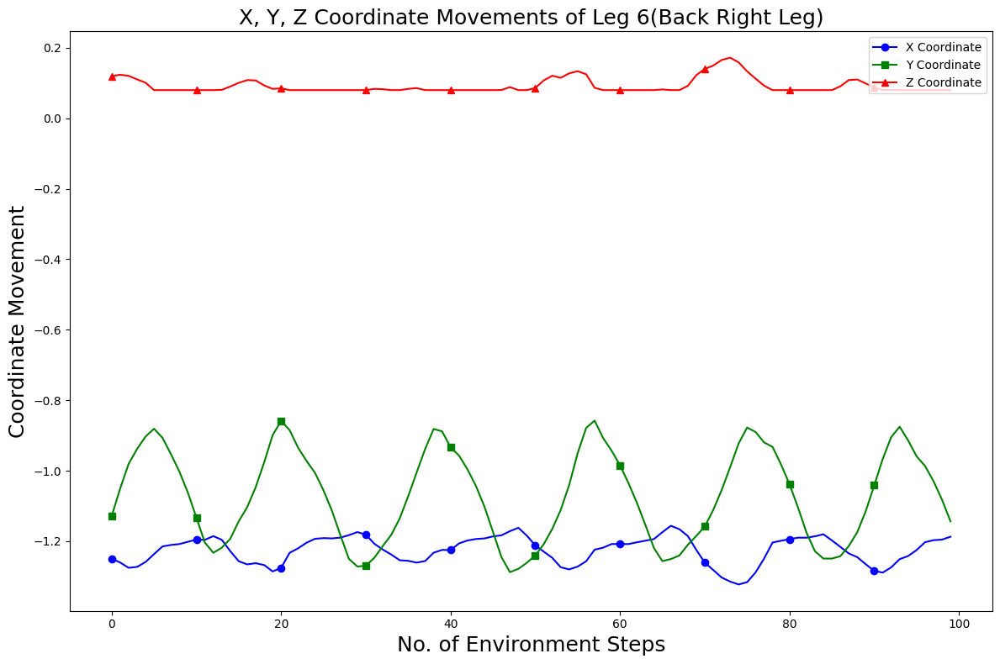

[Array(-1.2497808, dtype=float32), Array(-1.2603991, dtype=float32), Array(-1.2755778, dtype=float32), Array(-1.2729698, dtype=float32), Array(-1.2590697, dtype=float32), Array(-1.2367167, dtype=float32), Array(-1.2148167, dtype=float32), Array(-1.21072, dtype=float32), Array(-1.208095, dtype=float32), Array(-1.2016661, dtype=float32), Array(-1.1957605, dtype=float32), Array(-1.1960498, dtype=float32), Array(-1.1856084, dtype=float32), Array(-1.1961157, dtype=float32), Array(-1.2283505, dtype=float32), Array(-1.256953, dtype=float32), Array(-1.2658063, dtype=float32), Array(-1.2624601, dtype=float32), Array(-1.267756, dtype=float32), Array(-1.2858341, dtype=float32), Array(-1.2757164, dtype=float32), Array(-1.233058, dtype=float32), Array(-1.2204065, dtype=float32), Array(-1.2043762, dtype=float32), Array(-1.1931967, dtype=float32), Array(-1.1913385, dtype=float32), Array(-1.1921186, dtype=float32), Array(-1.1898865, dtype=float32), Array(-1.1828573, dtype=float32), Array(-1.174175, dt

In [41]:
import matplotlib.pyplot as plt

# Create a single plot
plt.figure(figsize=(12, 8))

# Data for Leg 1 (Front Left Leg)
leg_index = 15 # Assuming Leg 1 corresponds to index 0
timesteps = range(len(x_positions[leg_index]))  # Adjust this to match your timestep array

# Define unique markers and colors for x, y, and z coordinates
markers = ['o', 's', '^']
colors = ['blue', 'green', 'red']
labels = ['X Coordinate', 'Y Coordinate', 'Z Coordinate']

# Plotting X, Y, and Z coordinates
relative_x = [x - y for x, y in zip(x_positions[leg_index], body_x_positions)]
relative_y = [x - y for x, y in zip(y_positions[leg_index], body_y_positions)]
z_coord = z_positions[leg_index]  # Direct Z coordinates

# Plotting each coordinate
plt.plot(timesteps, relative_x, label=labels[0], color=colors[0], marker=markers[0], markevery=10)
plt.plot(timesteps, relative_y, label=labels[1], color=colors[1], marker=markers[1], markevery=10)
plt.plot(timesteps, z_coord, label=labels[2], color=colors[2], marker=markers[2], markevery=10)

# Adding legend, title, and labels
plt.legend(loc='upper right')
plt.title('X, Y, Z Coordinate Movements of Leg 6(Back Right Leg)', fontsize=18)
plt.xlabel('No. of Environment Steps', fontsize=18)
plt.ylabel('Coordinate Movement', fontsize=18)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg2_xyz_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()

print(relative_x)
print("------------")
print(relative_y)
print("------------")
print(z_coord)

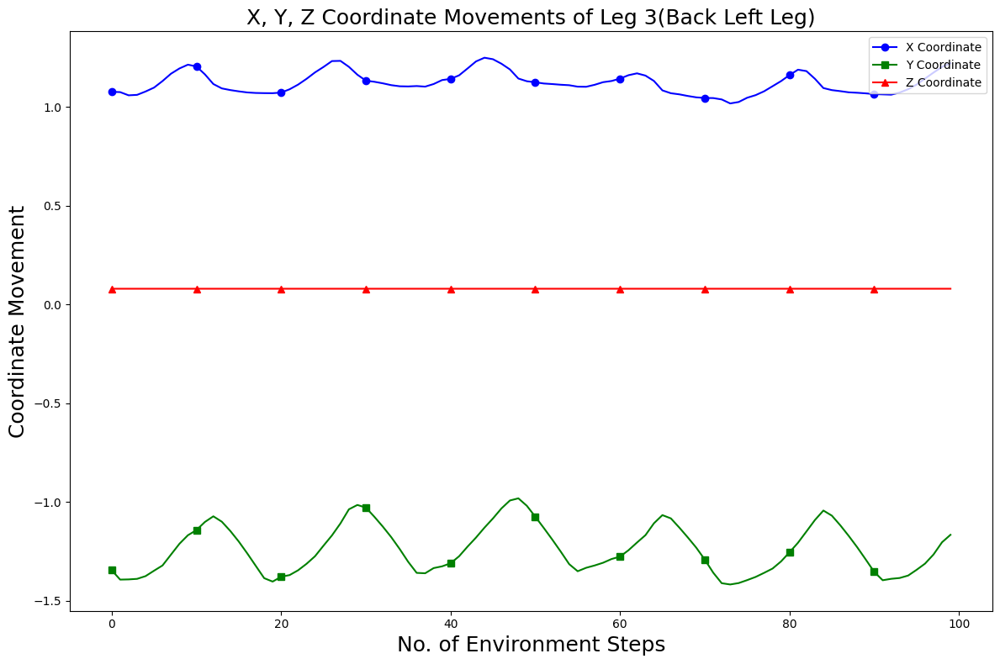

[Array(1.0768766, dtype=float32), Array(1.075281, dtype=float32), Array(1.0590421, dtype=float32), Array(1.0613767, dtype=float32), Array(1.0783867, dtype=float32), Array(1.0981115, dtype=float32), Array(1.131221, dtype=float32), Array(1.1684362, dtype=float32), Array(1.1950704, dtype=float32), Array(1.2141776, dtype=float32), Array(1.2052779, dtype=float32), Array(1.1653826, dtype=float32), Array(1.1162375, dtype=float32), Array(1.0940868, dtype=float32), Array(1.0856743, dtype=float32), Array(1.0791211, dtype=float32), Array(1.0736626, dtype=float32), Array(1.0710343, dtype=float32), Array(1.0701365, dtype=float32), Array(1.0698376, dtype=float32), Array(1.072966, dtype=float32), Array(1.0896504, dtype=float32), Array(1.1131787, dtype=float32), Array(1.1424507, dtype=float32), Array(1.1751016, dtype=float32), Array(1.2025739, dtype=float32), Array(1.2324561, dtype=float32), Array(1.2334697, dtype=float32), Array(1.2032492, dtype=float32), Array(1.1633896, dtype=float32), Array(1.1333

In [42]:
import matplotlib.pyplot as plt

# Create a single plot
plt.figure(figsize=(12, 8))

# Data for Leg 1 (Front Left Leg)
leg_index = 18 # Assuming Leg 1 corresponds to index 0
timesteps = range(len(x_positions[leg_index]))  # Adjust this to match your timestep array

# Define unique markers and colors for x, y, and z coordinates
markers = ['o', 's', '^']
colors = ['blue', 'green', 'red']
labels = ['X Coordinate', 'Y Coordinate', 'Z Coordinate']

# Plotting X, Y, and Z coordinates
relative_x = [x - y for x, y in zip(x_positions[leg_index], body_x_positions)]
relative_y = [x - y for x, y in zip(y_positions[leg_index], body_y_positions)]
z_coord = z_positions[leg_index]  # Direct Z coordinates

# Plotting each coordinate
plt.plot(timesteps, relative_x, label=labels[0], color=colors[0], marker=markers[0], markevery=10)
plt.plot(timesteps, relative_y, label=labels[1], color=colors[1], marker=markers[1], markevery=10)
plt.plot(timesteps, z_coord, label=labels[2], color=colors[2], marker=markers[2], markevery=10)

# Adding legend, title, and labels
plt.legend(loc='upper right')
plt.title('X, Y, Z Coordinate Movements of Leg 3(Back Left Leg)', fontsize=18)
plt.xlabel('No. of Environment Steps', fontsize=18)
plt.ylabel('Coordinate Movement', fontsize=18)

# Adjust layout
plt.tight_layout()

# Save the plot as a vector graphic
plt.savefig("leg2_xyz_movements.svg", format='svg')  # Replace 'svg' with 'pdf' or 'eps' if needed

# Display the plot
plt.show()

print(relative_x)
print("------------")
print(relative_y)
print("------------")
print(z_coord)
print("------------")
print(body_z_positions)
print("------------")